<a href="https://colab.research.google.com/github/Utkarshmishra2k2/Furniture-Sales-Prediction/blob/main/Furniture_Sales_Prediction%7BTime_Series_Project%7D.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Importing Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_squared_error

In [3]:
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.api import SimpleExpSmoothing
from statsmodels.tsa.api import ExponentialSmoothing
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
from statsmodels.tsa.arima.model import ARIMA
import statsmodels.api as sm
from statsmodels.tsa.statespace.sarimax import SARIMAX

In [4]:
!pip install pmdarima
from pmdarima.arima import auto_arima

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 17.5 MB/s eta 0:00:00


#Data Profiling

In [5]:
data = pd.read_csv( "https://raw.githubusercontent.com/UM1412/Data-Set/main/Time%20Series%20Project%20Data.csv" )

In [6]:
data.sample(10)

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,...,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
37,38,CA-2015-117415,12/27/2015,12/31/2015,Standard Class,SN-20710,Steve Nguyen,Home Office,United States,Houston,...,77041,Central,OFF-EN-10002986,Office Supplies,Envelopes,"#10-4 1/8"" x 9 1/2"" Premium Diagonal Seam Enve...",113.328,9,0.2,35.4150
7499,7500,CA-2017-121048,7/14/2017,7/18/2017,Standard Class,TC-21295,Toby Carlisle,Consumer,United States,Westminster,...,92683,West,FUR-FU-10002960,Furniture,Furnishings,"Eldon 200 Class Desk Accessories, Burgundy",18.840,3,0.0,7.9128
4877,4878,US-2014-155817,10/3/2014,10/9/2014,Standard Class,SL-20155,Sara Luxemburg,Home Office,United States,Durham,...,27707,South,OFF-AR-10002335,Office Supplies,Art,DIXON Oriole Pencils,6.192,3,0.2,0.4644
3582,3583,CA-2015-121650,12/10/2015,12/16/2015,Standard Class,KD-16495,Keith Dawkins,Corporate,United States,Jackson,...,49201,Central,OFF-AR-10001149,Office Supplies,Art,Avery Hi-Liter Comfort Grip Fluorescent Highli...,3.900,2,0.0,1.5210
7470,7471,CA-2015-100734,9/15/2015,9/20/2015,Standard Class,AC-10615,Ann Chong,Corporate,United States,Philadelphia,...,19143,East,OFF-BI-10002609,Office Supplies,Binders,Avery Hidden Tab Dividers for Binding Systems,3.576,4,0.7,-2.8608
5891,5892,CA-2016-146157,11/21/2016,11/26/2016,Standard Class,RD-19720,Roger Demir,Consumer,United States,Chicago,...,60610,Central,OFF-ST-10001590,Office Supplies,Storage,Tenex Personal Project File with Scoop Front D...,21.568,2,0.2,1.6176
6451,6452,CA-2015-156510,9/25/2015,9/29/2015,Standard Class,EH-13990,Erica Hackney,Consumer,United States,Meriden,...,6450,East,OFF-AR-10004930,Office Supplies,Art,Turquoise Lead Holder with Pocket Clip,6.700,1,0.0,2.2110
5034,5035,CA-2015-103954,8/9/2015,8/13/2015,Second Class,HR-14770,Hallie Redmond,Home Office,United States,Milwaukee,...,53209,Central,FUR-BO-10004690,Furniture,Bookcases,O'Sullivan Cherrywood Estates Traditional Barr...,687.400,5,0.0,48.1180
5440,5441,US-2017-153633,11/13/2017,11/18/2017,Second Class,TC-21295,Toby Carlisle,Consumer,United States,Jupiter,...,33458,South,OFF-AR-10002335,Office Supplies,Art,DIXON Oriole Pencils,2.064,1,0.2,0.1548
4946,4947,CA-2016-151372,9/5/2016,9/6/2016,First Class,JH-15985,Joseph Holt,Consumer,United States,Redondo Beach,...,90278,West,OFF-FA-10000304,Office Supplies,Fasteners,Advantus Push Pins,4.360,2,0.0,1.7876


In [7]:
data.shape

(9994, 21)

**Getting Furniture Data**

In [8]:
data_01 = data[data.Category == "Furniture"]

In [9]:
data_01.sample(10)

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,...,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
5043,5044,CA-2016-158694,11/10/2016,11/13/2016,Second Class,AI-10855,Arianne Irving,Consumer,United States,Los Angeles,...,90036,West,FUR-FU-10000965,Furniture,Furnishings,"Howard Miller 11-1/2"" Diameter Ridgewood Wall ...",467.460,9,0.0,191.6586
3519,3520,CA-2015-124975,6/22/2015,6/25/2015,First Class,MG-17875,Michael Grace,Home Office,United States,Aurora,...,60505,Central,FUR-TA-10002645,Furniture,Tables,Hon Rectangular Conference Tables,796.425,7,0.5,-525.6405
4418,4419,CA-2014-160157,12/20/2014,12/27/2014,Standard Class,MH-17455,Mark Hamilton,Consumer,United States,Hamilton,...,45011,East,FUR-FU-10003773,Furniture,Furnishings,Eldon Cleatmat Plus Chair Mats for High Pile C...,190.848,3,0.2,-21.4704
8660,8661,CA-2017-124765,11/25/2017,11/30/2017,Standard Class,HZ-14950,Henia Zydlo,Consumer,United States,Fort Lauderdale,...,33311,South,FUR-BO-10003965,Furniture,Bookcases,O'Sullivan Manor Hill 2-Door Library in Briann...,723.920,5,0.2,-81.4410
9557,9558,CA-2014-103086,10/17/2014,10/19/2014,Second Class,EB-14170,Evan Bailliet,Consumer,United States,Houston,...,77095,Central,FUR-FU-10004586,Furniture,Furnishings,G.E. Longer-Life Indoor Recessed Floodlight Bulbs,5.312,2,0.6,-1.5936
3457,3458,CA-2017-136448,9/16/2017,9/18/2017,First Class,AS-10090,Adam Shillingsburg,Consumer,United States,Philadelphia,...,19143,East,FUR-FU-10003832,Furniture,Furnishings,Eldon Expressions Punched Metal & Wood Desk Ac...,22.512,3,0.2,2.2512
4625,4626,CA-2017-147228,9/9/2017,9/14/2017,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Columbia,...,38401,South,FUR-FU-10000023,Furniture,Furnishings,Eldon Wave Desk Accessories,14.136,3,0.2,4.2408
5124,5125,CA-2014-160766,9/14/2014,9/14/2014,Same Day,DM-13015,Darrin Martin,Consumer,United States,New York City,...,10009,East,FUR-TA-10001039,Furniture,Tables,KI Adjustable-Height Table,464.292,9,0.4,-108.3348
6291,6292,CA-2017-143756,12/2/2017,12/5/2017,First Class,ME-17725,Max Engle,Consumer,United States,Salem,...,24153,South,FUR-CH-10001854,Furniture,Chairs,Office Star - Professional Matrix Back Chair w...,701.960,2,0.0,168.4704
7105,7106,CA-2017-128944,6/19/2017,6/21/2017,Second Class,KH-16330,Katharine Harms,Corporate,United States,Newark,...,43055,East,FUR-FU-10004909,Furniture,Furnishings,Contemporary Wood/Metal Frame,38.784,3,0.2,7.2720


In [10]:
data_01.shape

(2121, 21)

In [11]:
data_01.dtypes

Row ID             int64
Order ID          object
Order Date        object
Ship Date         object
Ship Mode         object
Customer ID       object
Customer Name     object
Segment           object
Country           object
City              object
State             object
Postal Code        int64
Region            object
Product ID        object
Category          object
Sub-Category      object
Product Name      object
Sales            float64
Quantity           int64
Discount         float64
Profit           float64
dtype: object

In [12]:
data_01.isnull().sum()

Row ID           0
Order ID         0
Order Date       0
Ship Date        0
Ship Mode        0
Customer ID      0
Customer Name    0
Segment          0
Country          0
City             0
State            0
Postal Code      0
Region           0
Product ID       0
Category         0
Sub-Category     0
Product Name     0
Sales            0
Quantity         0
Discount         0
Profit           0
dtype: int64

*  Tere is No Null Values

In [13]:
for i in data_01:
    value = data_01[i].value_counts()
    print(value)

1       1
6714    1
6783    1
6780    1
6779    1
       ..
3337    1
3334    1
3324    1
3321    1
9991    1
Name: Row ID, Length: 2121, dtype: int64
US-2015-129007    4
CA-2017-100111    4
US-2017-162558    4
CA-2015-104346    4
US-2015-138121    4
                 ..
CA-2017-111556    1
CA-2016-157686    1
CA-2015-152891    1
CA-2015-110016    1
CA-2017-121258    1
Name: Order ID, Length: 1764, dtype: int64
9/5/2016      10
12/1/2016      9
11/19/2017     9
10/30/2017     9
12/25/2016     9
              ..
10/30/2015     1
7/9/2015       1
9/9/2016       1
6/22/2015      1
1/21/2014      1
Name: Order Date, Length: 889, dtype: int64
12/6/2017     10
12/16/2015    10
10/24/2017     9
9/14/2016      8
9/22/2016      8
              ..
1/5/2018       1
7/15/2017      1
6/25/2017      1
1/8/2015       1
3/3/2017       1
Name: Ship Date, Length: 960, dtype: int64
Standard Class    1248
Second Class       427
First Class        327
Same Day           119
Name: Ship Mode, dtype: int64
SV-

* Tere no Special character in data set

#Data Visualization

## 1 - Univariate Data Analysis

Text(0.5, 1.0, 'Count plot for Ship Mode')

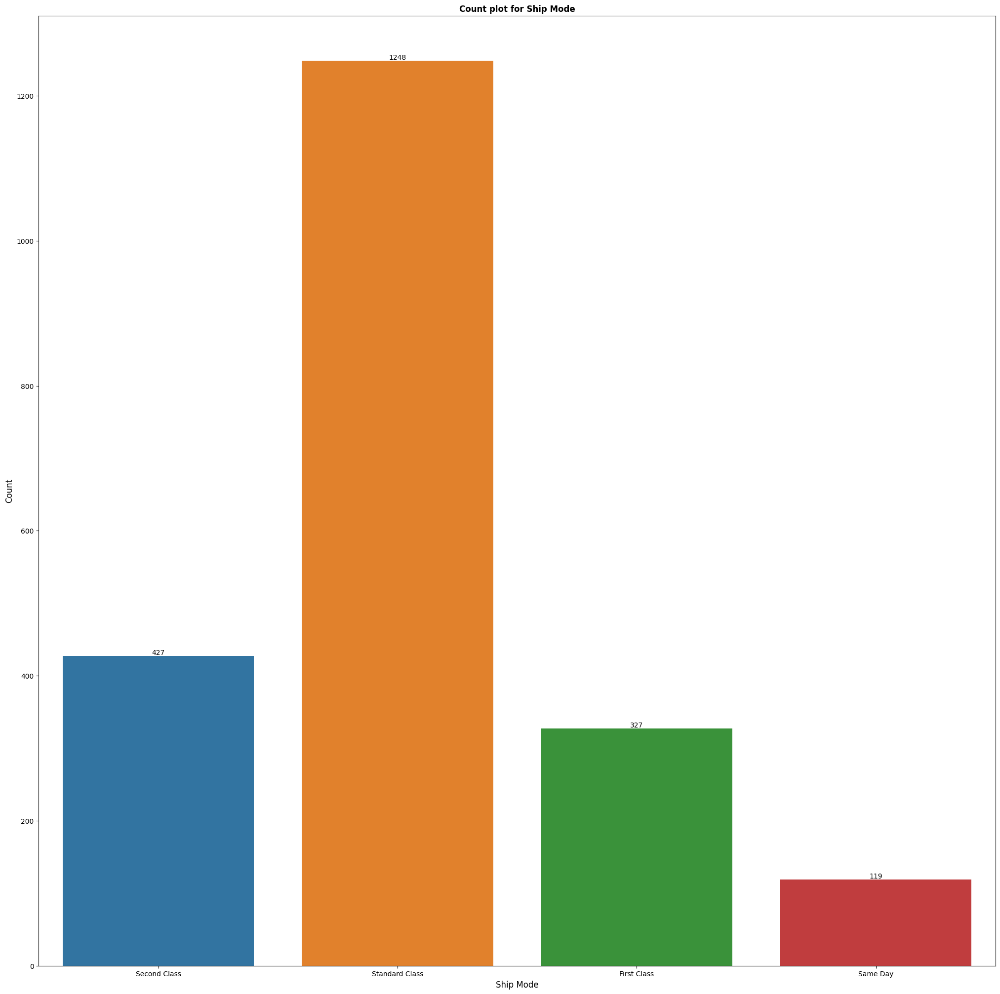

In [14]:
plt.figure(figsize=(25,25))
ax = sns.countplot(data=data_01,x="Ship Mode")
for container in ax.containers:
    ax.bar_label(container)
plt.xlabel("Ship Mode", fontsize = 12)
plt.ylabel("Count", fontsize = 12)
plt.title('Count plot for Ship Mode',fontweight='bold')

*  **Interpretation:-**

The mostly used Ship mode is 'Standard Class' followed by 'Second class'.

Text(0.5, 1.0, 'Count plot for Segment')

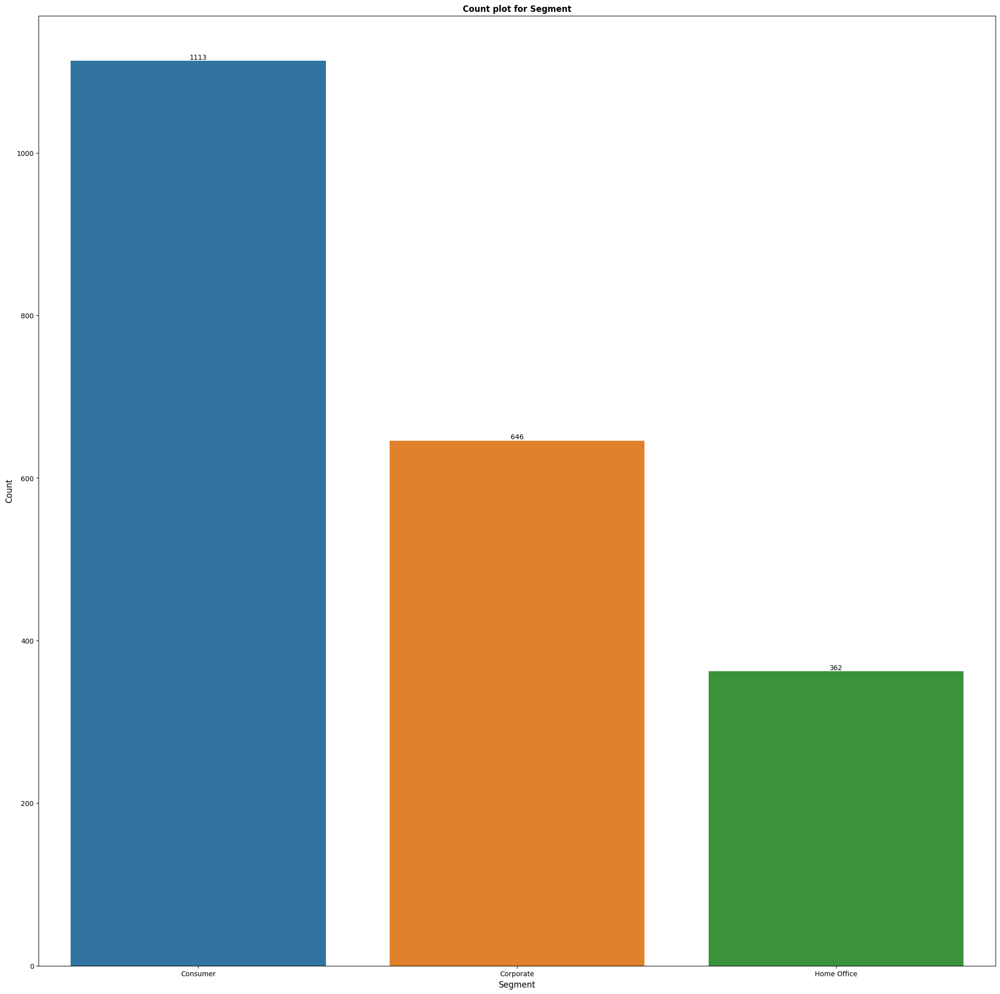

In [15]:
plt.figure(figsize=(25,25))
ax = sns.countplot(data=data_01,x="Segment")
for container in ax.containers:
    ax.bar_label(container)
plt.xlabel("Segment", fontsize = 12)
plt.ylabel("Count", fontsize = 12)
plt.title('Count plot for Segment',fontweight='bold')

*  **Interpretation:-**

The highest segment the sales of furniture belongs to 'Consumer Segment'.

Text(0.5, 1.0, 'Count plot for Region')

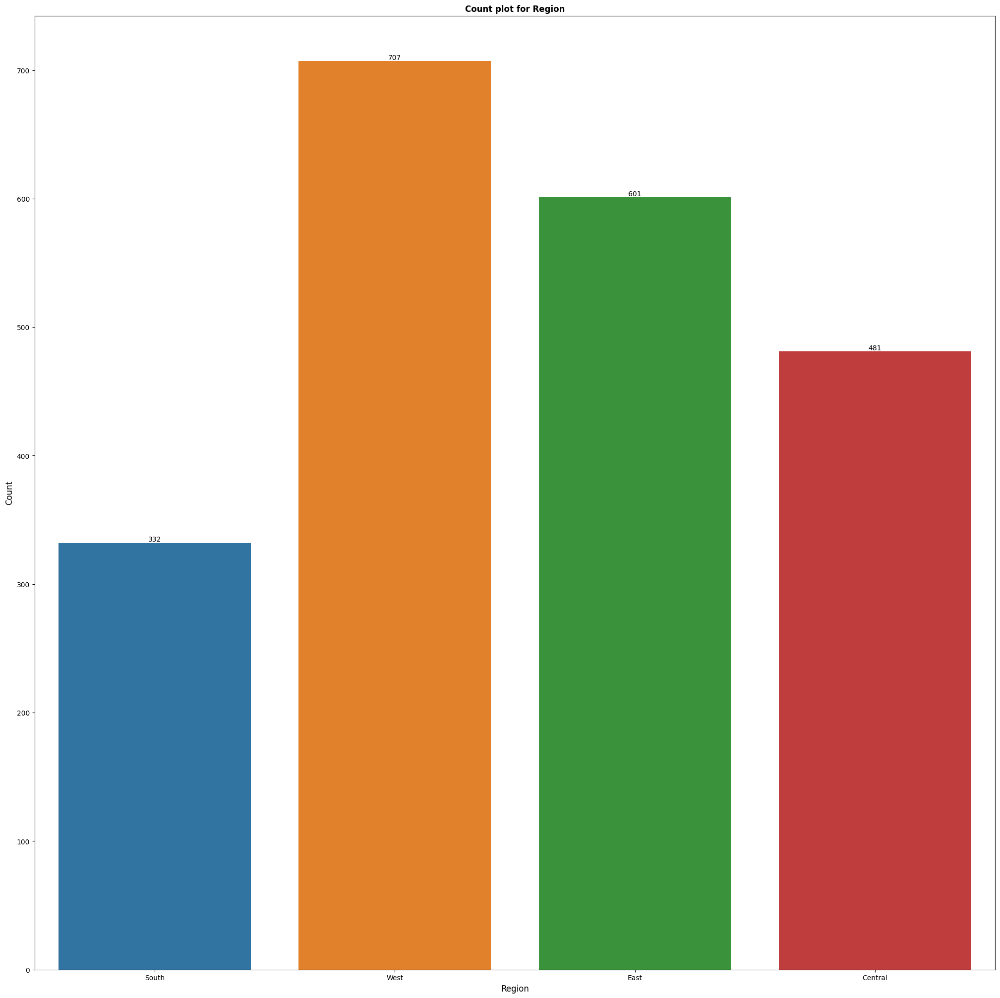

In [16]:
plt.figure(figsize=(25,25))
ax = sns.countplot(data=data_01,x="Region")
for container in ax.containers:
    ax.bar_label(container)
plt.xlabel("Region", fontsize = 12)
plt.ylabel("Count", fontsize = 12)
plt.title('Count plot for Region',fontweight='bold')

*  **Interpretation:-**

The most products of furniture are sold in the 'West region'.

Text(0.5, 1.0, 'Count plot for Sub-Category')

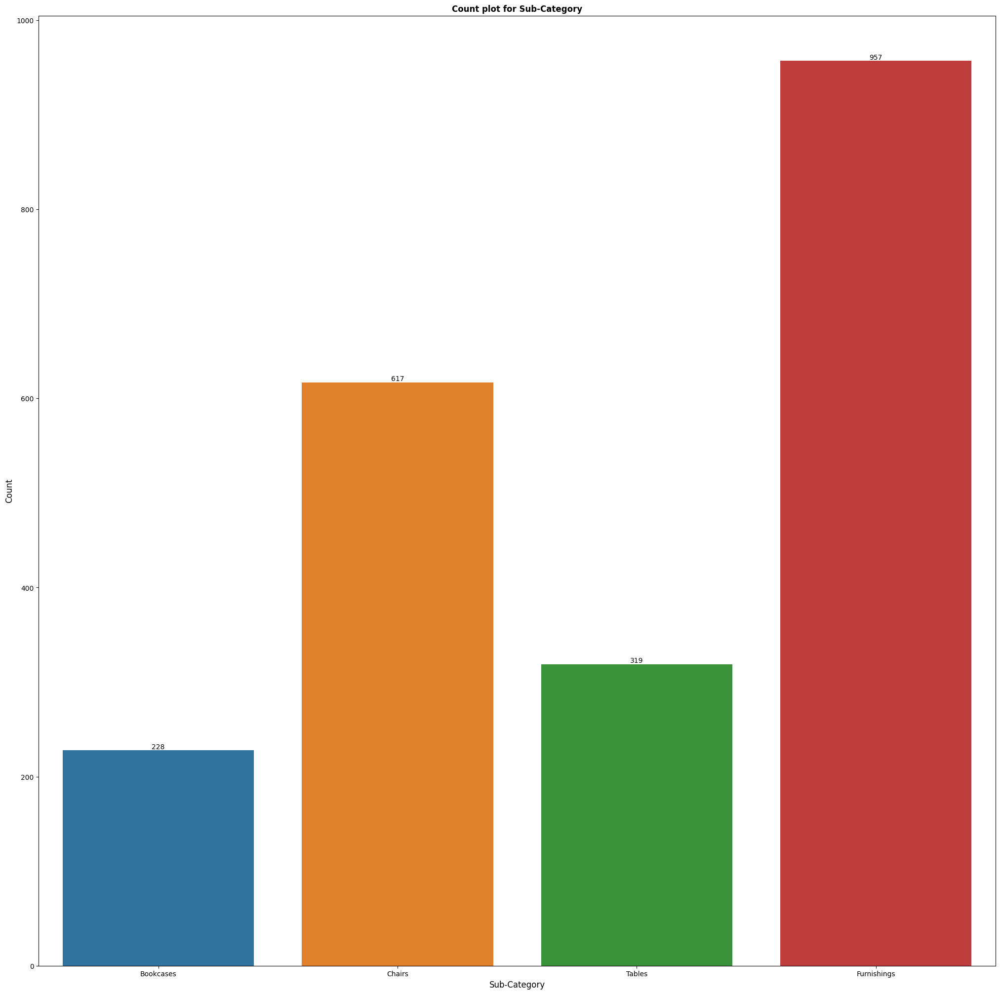

In [17]:
plt.figure(figsize=(25,25))
ax = sns.countplot(data=data_01,x="Sub-Category")
for container in ax.containers:
    ax.bar_label(container)
plt.xlabel("Sub-Category", fontsize = 12)
plt.ylabel("Count", fontsize = 12)
plt.title('Count plot for Sub-Category',fontweight='bold')

*  **Interpretation:-**

The subcategory 'Furnishings' are mostly sold followed by 'Chairs'.

In [18]:
data_01["Sales"].max()

4416.174

In [19]:
data_01["Sales"].min()

1.892

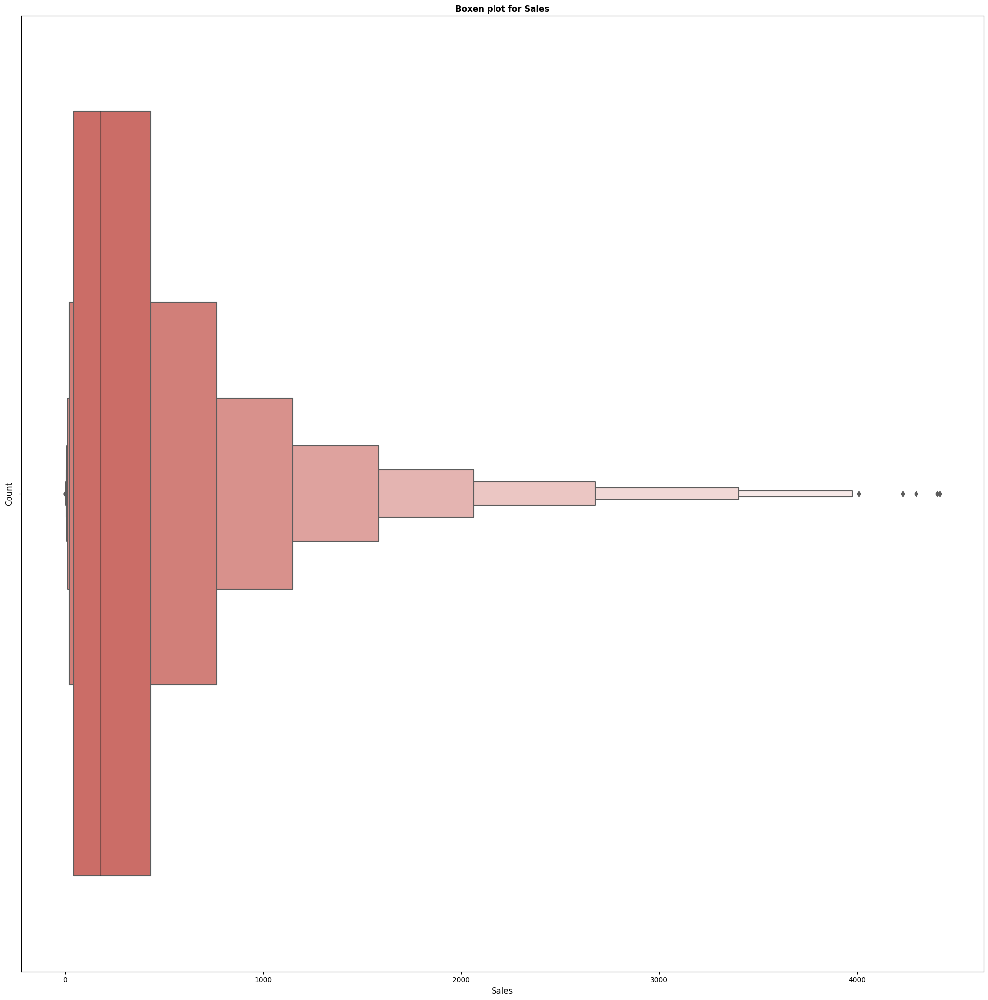

In [20]:
plt.figure(figsize=(25,25))
sns.boxenplot(x=data_01["Sales"], data = data_01, palette = 'hls')
plt.xlabel("Sales", fontsize = 12)
plt.ylabel("Count", fontsize = 12)
plt.title('Boxen plot for Sales',fontweight='bold')
plt.show()

*  **Interpretation:-**

The mean is greater than median data is right skewed and the data is mostly towards the left. 

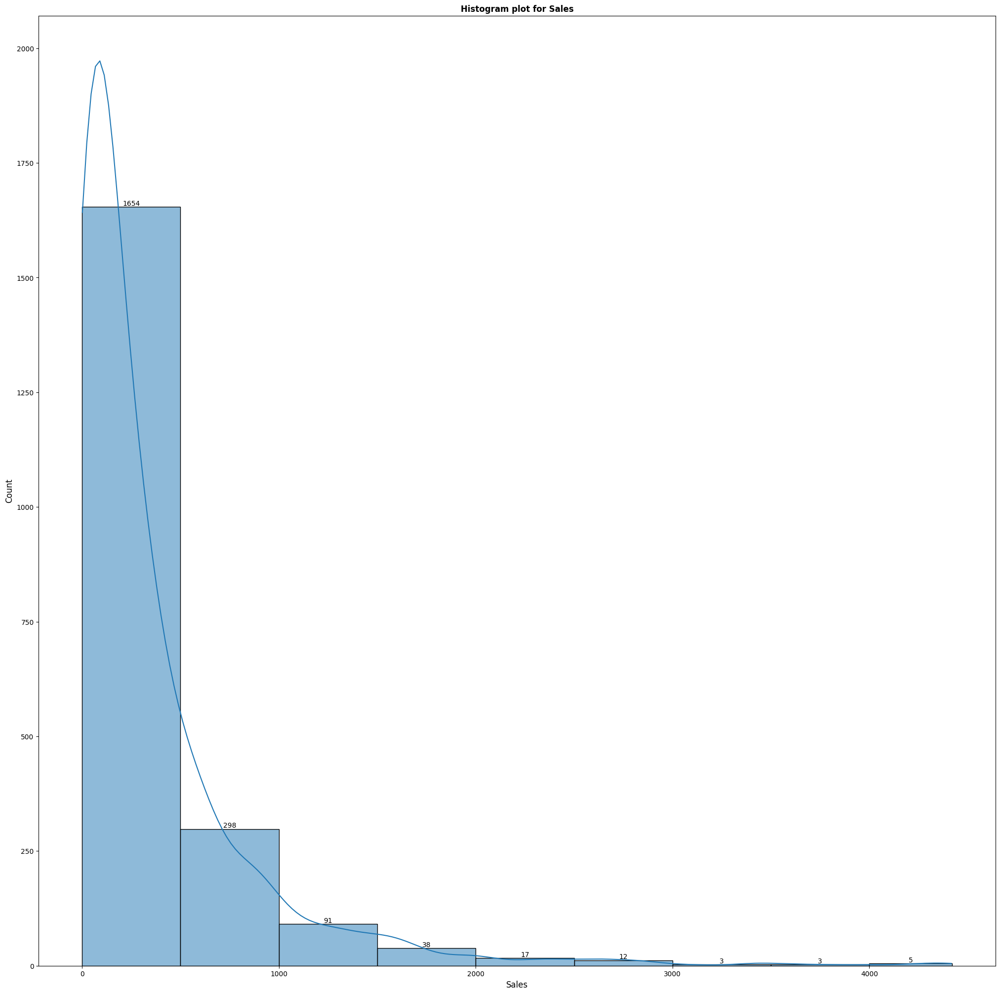

In [21]:
plt.figure(figsize=(25,25))
ax = sns.histplot(data=data_01["Sales"],bins=[1,500,1000,1500,2000,2500,3000,3500,4000,4420],kde=True)
for container in ax.containers:
    ax.bar_label(container)
plt.xlabel("Sales", fontsize = 12)
plt.ylabel("Count", fontsize = 12)
plt.title('Histogram plot for Sales',fontweight='bold')
plt.show()

*  **Interpretation:-**

The Sales are not distributed normally from the box plot we can see their are more outliers 

In [22]:
data_01["Profit"].max()

1013.127

In [23]:
data_01["Profit"].min()

-1862.3124

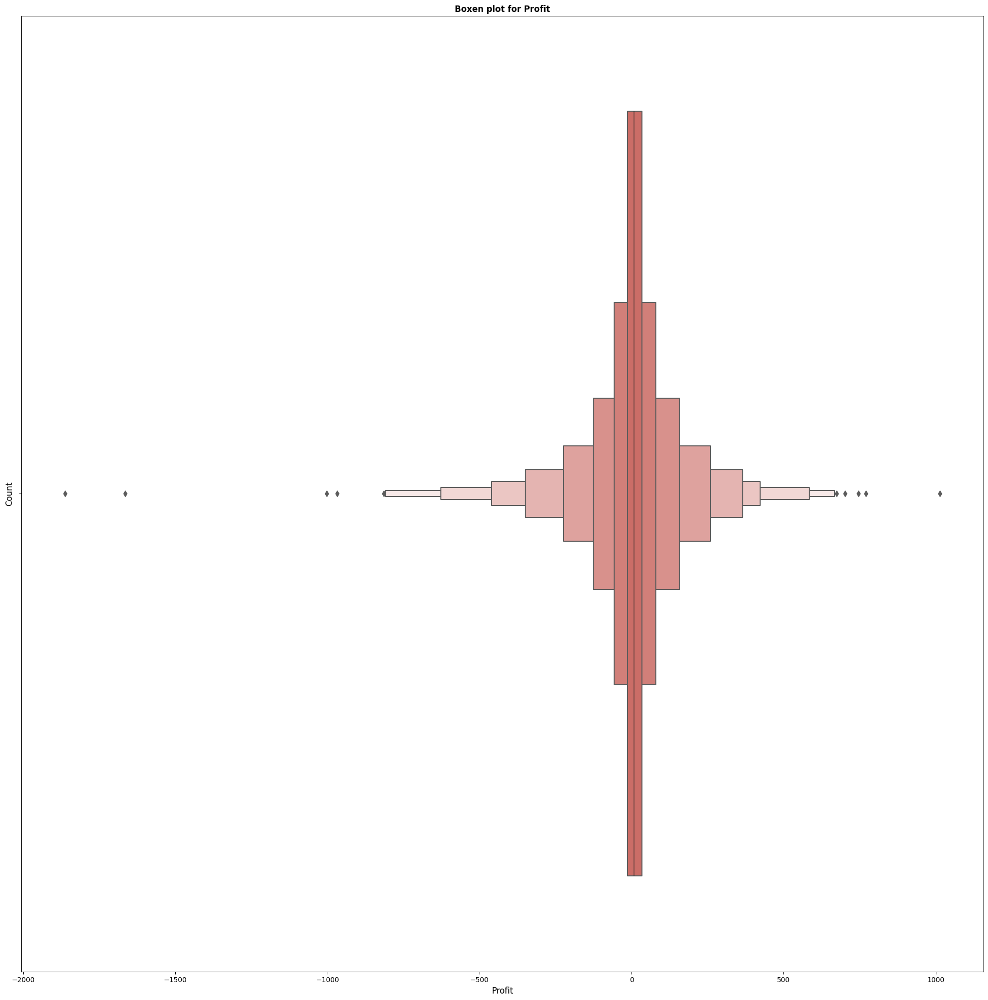

In [24]:
plt.figure(figsize=(25,25))
sns.boxenplot(x=data_01["Profit"], data = data_01, palette = 'hls')
plt.xlabel("Profit", fontsize = 12)
plt.ylabel("Count", fontsize = 12)
plt.title('Boxen plot for Profit',fontweight='bold')
plt.show()

*  **Interpretation:-**

The mean is less than median data is left skewed and the data is mostly towards the right.  

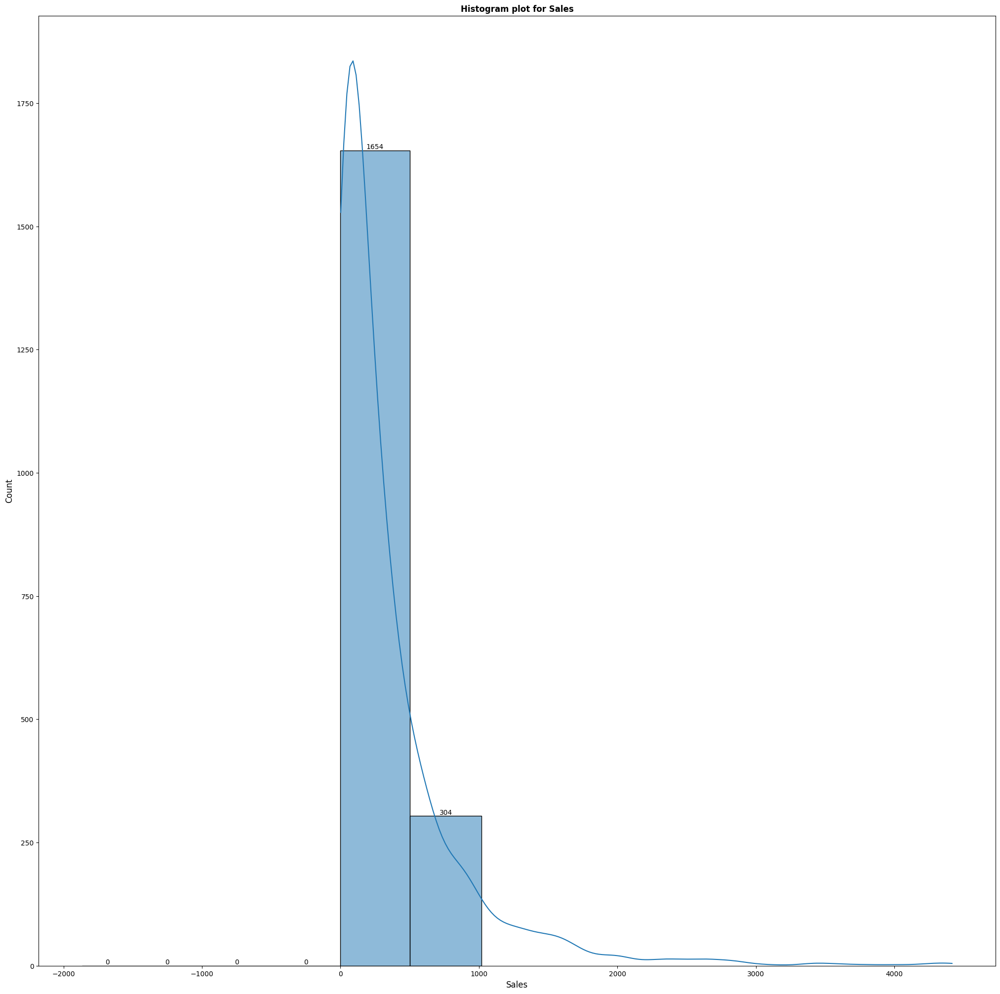

In [25]:
plt.figure(figsize=(25,25))
ax = sns.histplot(data=data_01["Sales"],bins=[-1865,-1500,-1000,-500,0,500,1020],kde=True)
for container in ax.containers:
    ax.bar_label(container)
plt.xlabel("Sales", fontsize = 12)
plt.ylabel("Count", fontsize = 12)
plt.title('Histogram plot for Sales',fontweight='bold')
plt.show()

*  **Interpretation:-**

The profits are not distributed normally from the box plot we can see their are more outliers.

## 2 -Bivaraite Data Analysis

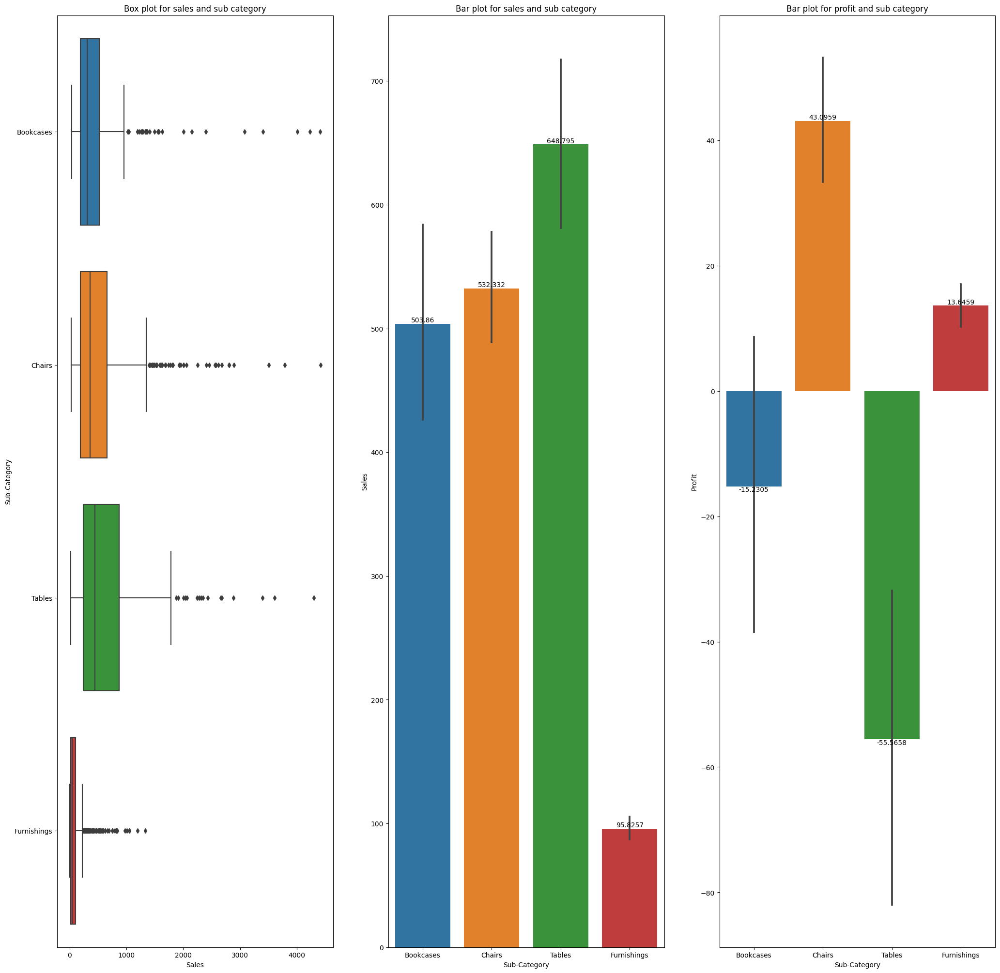

In [26]:
plt.subplots(1,3,figsize=(25,25))

plt.subplot(131)
sns.boxplot(data=data_01, x='Sales', y='Sub-Category')
plt.title('Box plot for sales and sub category')

plt.subplot(132)
ax=sns.barplot(data=data_01, y='Sales', x='Sub-Category')
for container in ax.containers:
    ax.bar_label(container)
plt.title('Bar plot for sales and sub category')

plt.subplot(133)
ax=sns.barplot(data=data_01, y='Profit', x='Sub-Category')
for container in ax.containers:
    ax.bar_label(container)
plt.title('Bar plot for profit and sub category')
plt.show()

*  **Interpretation:- For sub-Category**
    * The Sales of 'Tables' are highest compared to others but these products are not profitable they are in losses.
    * The Sales of 'Chairs' are second highest and the 'profits' are highest compared to other sub category products.
    * The Sales of 'Bookcases' are third highest but not profitable they are in losses.
    * The Sales of 'furnishings' are least but these sub category products are profitable.

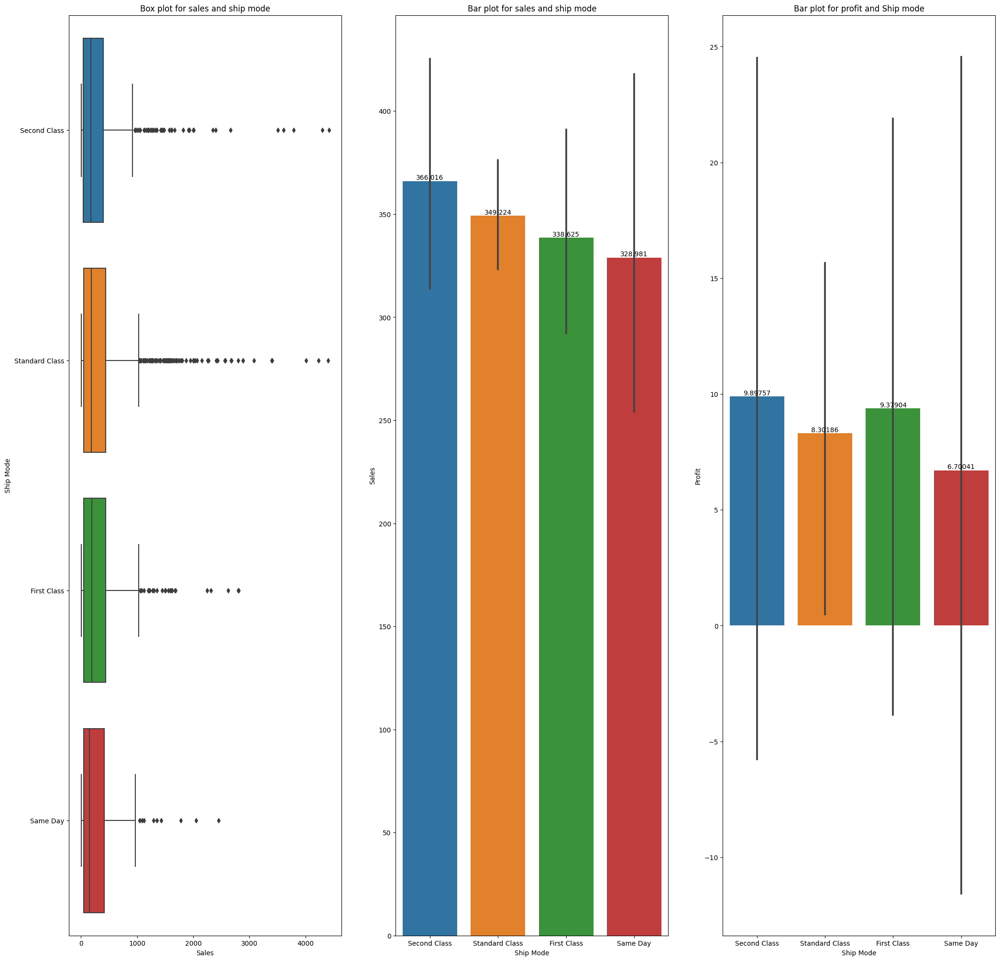

In [27]:
plt.subplots(1,3,figsize=(25,25))

plt.subplot(131)
sns.boxplot(data=data_01, x='Sales', y='Ship Mode')
plt.title('Box plot for sales and ship mode')

plt.subplot(132)
ax=sns.barplot(data=data_01, y='Sales', x='Ship Mode')
for container in ax.containers:
    ax.bar_label(container)
plt.title('Bar plot for sales and ship mode')

plt.subplot(133)
ax=sns.barplot(data=data_01, y='Profit', x='Ship Mode')
for container in ax.containers:
    ax.bar_label(container)
plt.title('Bar plot for profit and Ship mode')
plt.show()

* **Interpretation:- For Ship Mode**
    * The Sales and the profits of the  'Second Class' ship mode are highest compared to other ship modes.
    * The Sales 'Standard Class' are second highest and the 'profits' are more compared to 'Same day' ship mode.
    * The Sales of 'First Class' are third highest but the profits are more than 'Standard class' and 
    less than 'Second Class'.
    * The Sales and profits of 'Same Day' ship mode are least.    

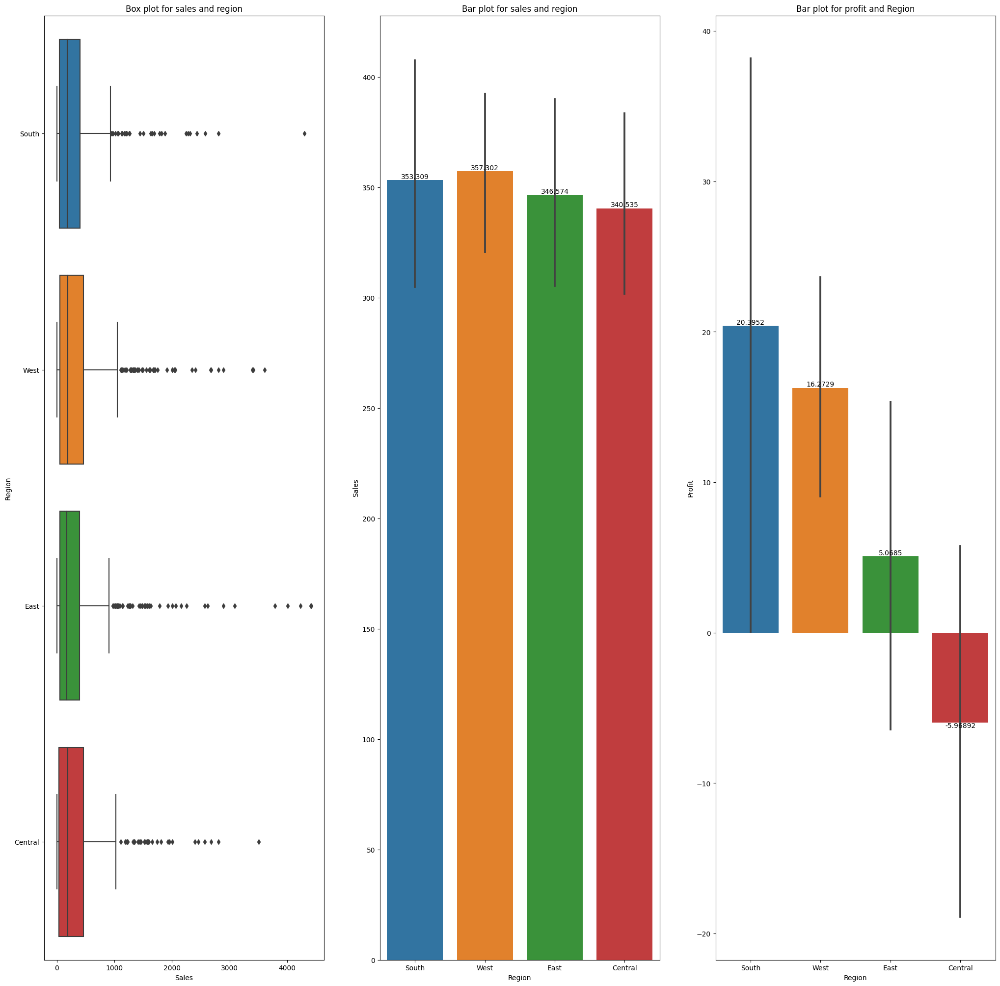

In [28]:
plt.subplots(1,3,figsize=(25,25))

plt.subplot(131)
sns.boxplot(data=data_01, x='Sales', y='Region')
plt.title('Box plot for sales and region')

plt.subplot(132)
ax=sns.barplot(data=data_01, y='Sales', x='Region')
for container in ax.containers:
    ax.bar_label(container)
plt.title('Bar plot for sales and region')

plt.subplot(133)
ax=sns.barplot(data=data_01, y='Profit', x='Region')
for container in ax.containers:
    ax.bar_label(container)
plt.title('Bar plot for profit and Region')
plt.show()

* **Interpretation:- For region**
    * The Sales are Highest in the 'West Region' but the profits are less compared to 'South region'.
    * The Sales in 'South Region' are second highest and the 'profits' are highest compared to other regions.
    * The Sales in 'East Region' are third highest but profits are less than South and West regions.
    * The Sales in 'Central Region' are least and in these region products are not profitable.     

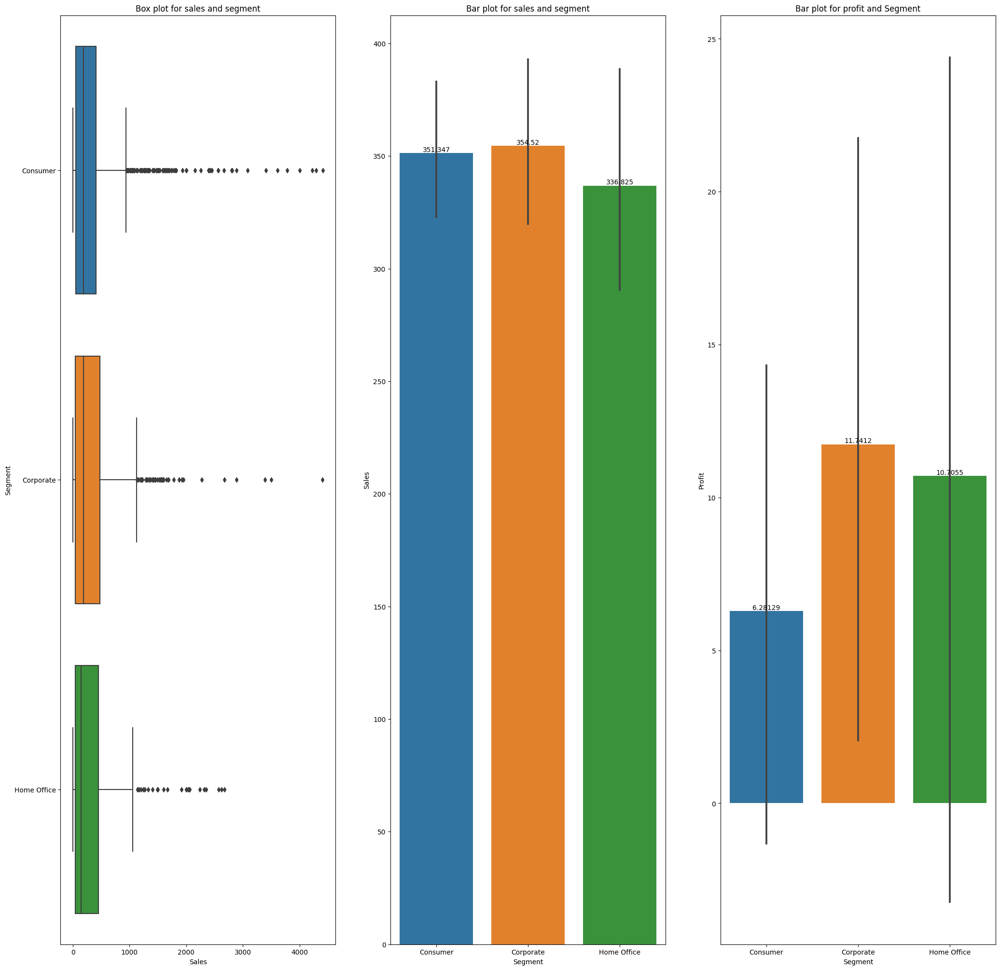

In [29]:
plt.subplots(1,3,figsize=(25,25))

plt.subplot(131)
sns.boxplot(data=data_01, x='Sales', y='Segment')
plt.title('Box plot for sales and segment')

plt.subplot(132)
ax=sns.barplot(data=data_01, y='Sales', x='Segment')
for container in ax.containers:
    ax.bar_label(container)
plt.title('Bar plot for sales and segment')

plt.subplot(133)
ax=sns.barplot(data=data_01, y='Profit', x='Segment')
for container in ax.containers:
    ax.bar_label(container)
plt.title('Bar plot for profit and Segment')
plt.show()

* **Interpretation:- For Segment**
    * The Sales and profits are highest in 'Corporate Segment' compared to other segments.
    * In 'Consumer Segment' the Sales are second highest but the profits are least compared to other segments.
    * The Sales are least in 'Home Office' but the profits are more compared to 'Consumer Segment' and 
    less compared to 'Corporate segment'.  

## 3 - Multivariate Data Analysis

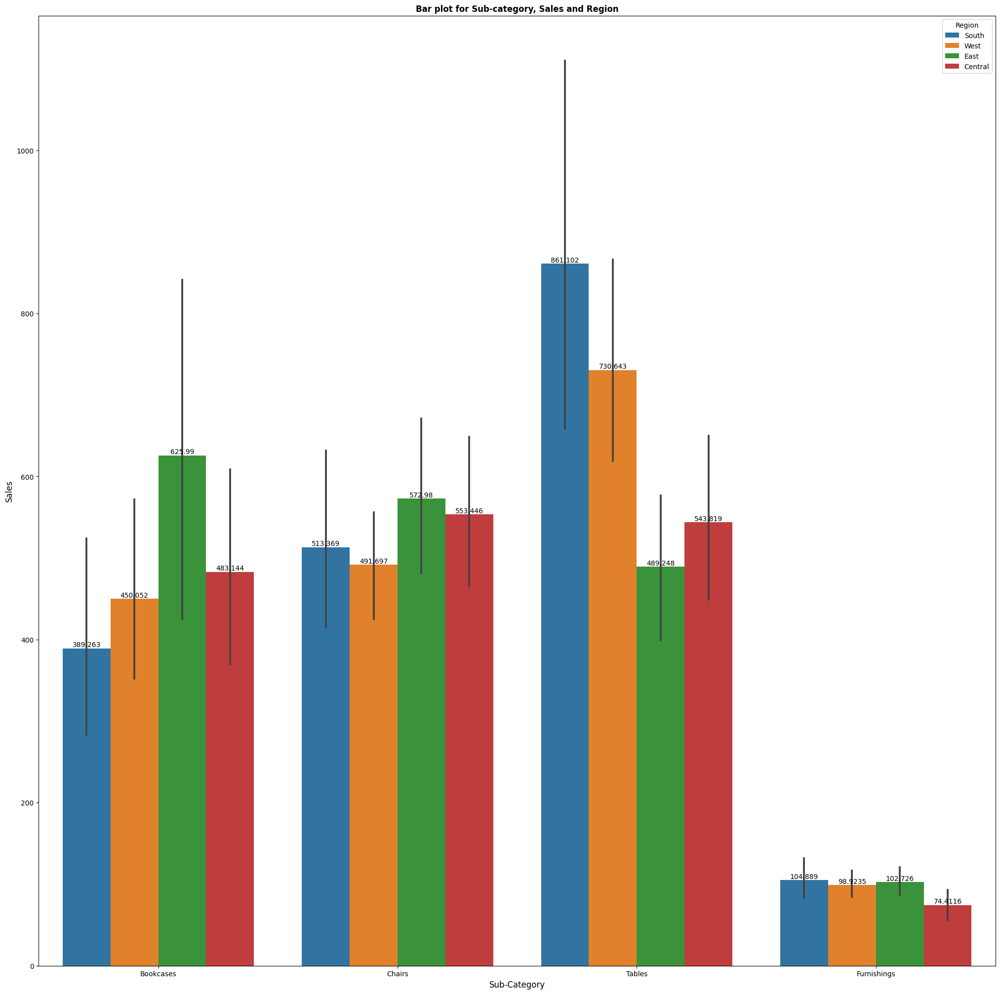

In [30]:
plt.figure(figsize=(25,25))
ax=sns.barplot(data=data_01, x='Sub-Category', y='Sales',hue='Region')
for container in ax.containers:
    ax.bar_label(container)
plt.xlabel("Sub-Category", fontsize = 12)
plt.ylabel("Sales", fontsize = 12)
plt.title('Bar plot for Sub-category, Sales and Region',fontweight='bold')
plt.show()

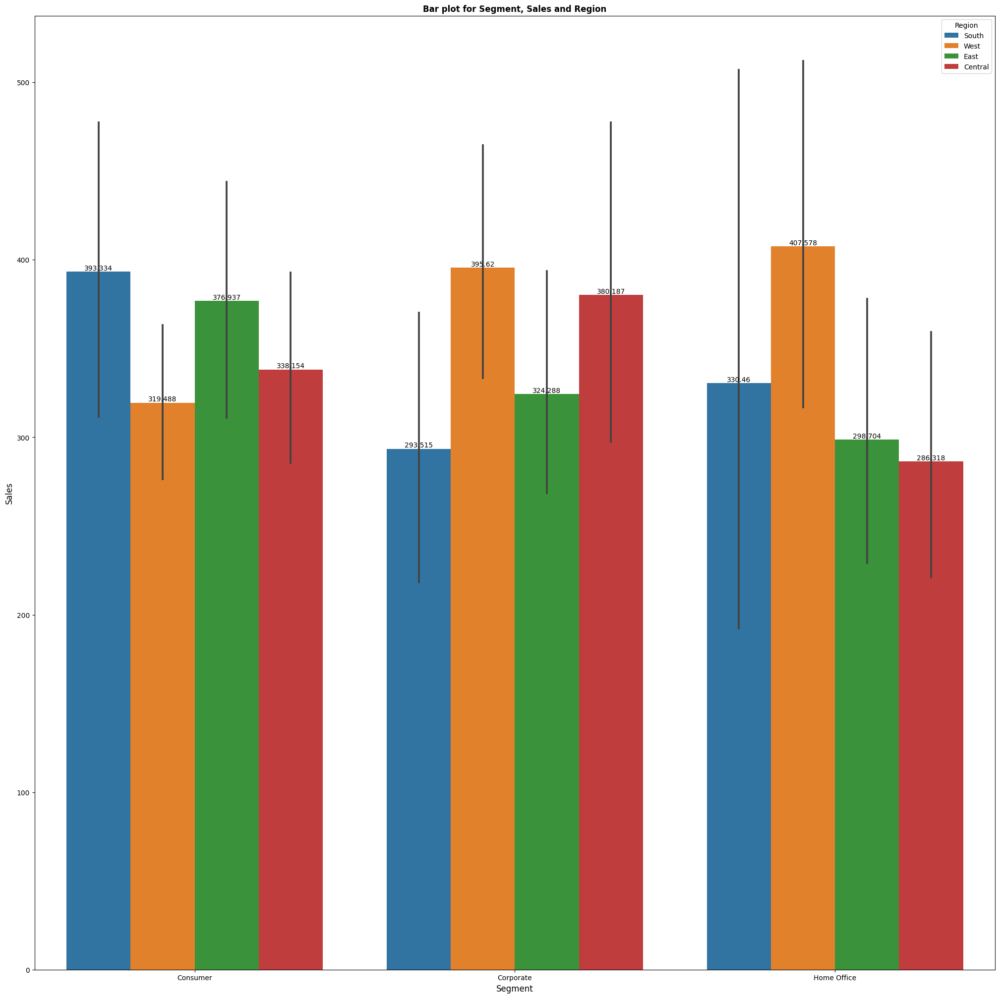

In [31]:
plt.figure(figsize=(25,25))
ax=sns.barplot(data=data_01, x='Segment', y='Sales',hue='Region')
for container in ax.containers:
    ax.bar_label(container)
plt.xlabel("Segment", fontsize = 12)
plt.ylabel("Sales", fontsize = 12)
plt.title('Bar plot for Segment, Sales and Region',fontweight='bold')
plt.show()

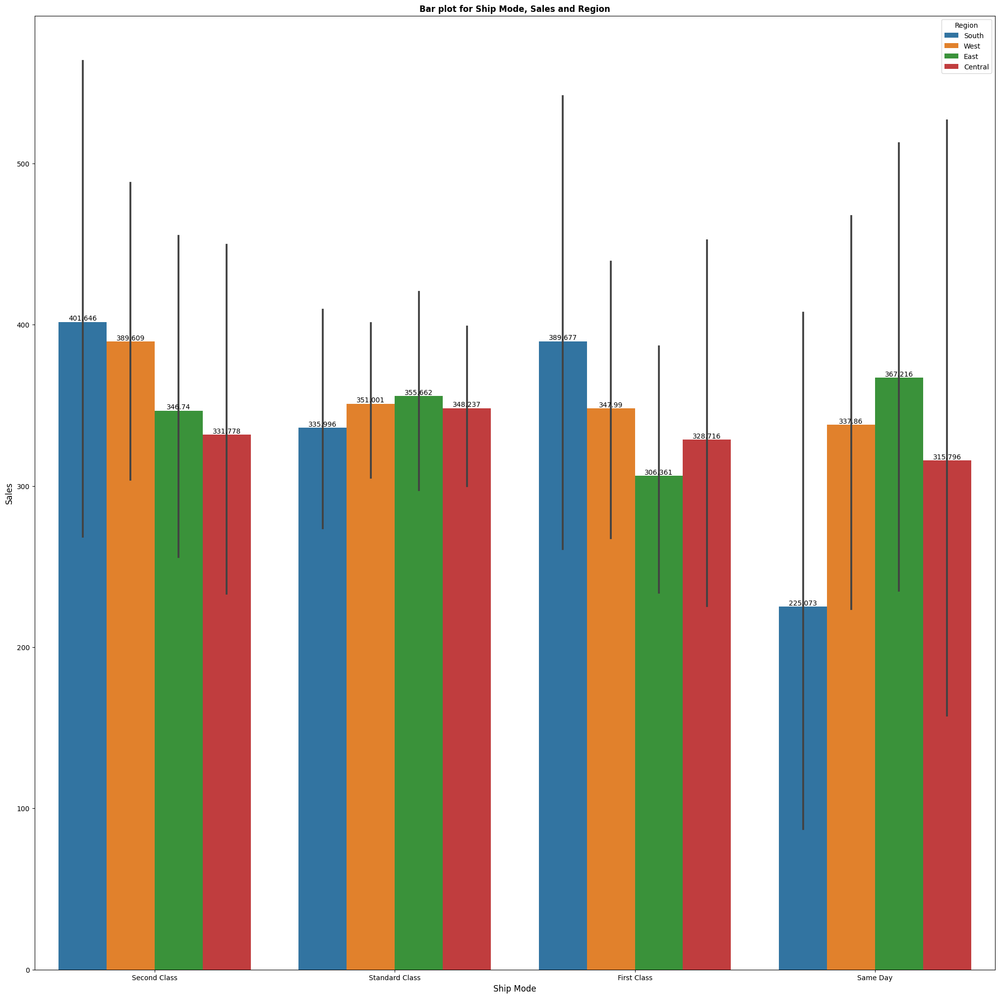

In [32]:
plt.figure(figsize=(25,25))
ax=sns.barplot(data=data_01, x='Ship Mode', y='Sales',hue='Region')
for container in ax.containers:
    ax.bar_label(container)
plt.xlabel("Ship Mode", fontsize = 12)
plt.ylabel("Sales", fontsize = 12)
plt.title('Bar plot for Ship Mode, Sales and Region',fontweight='bold')
plt.show()

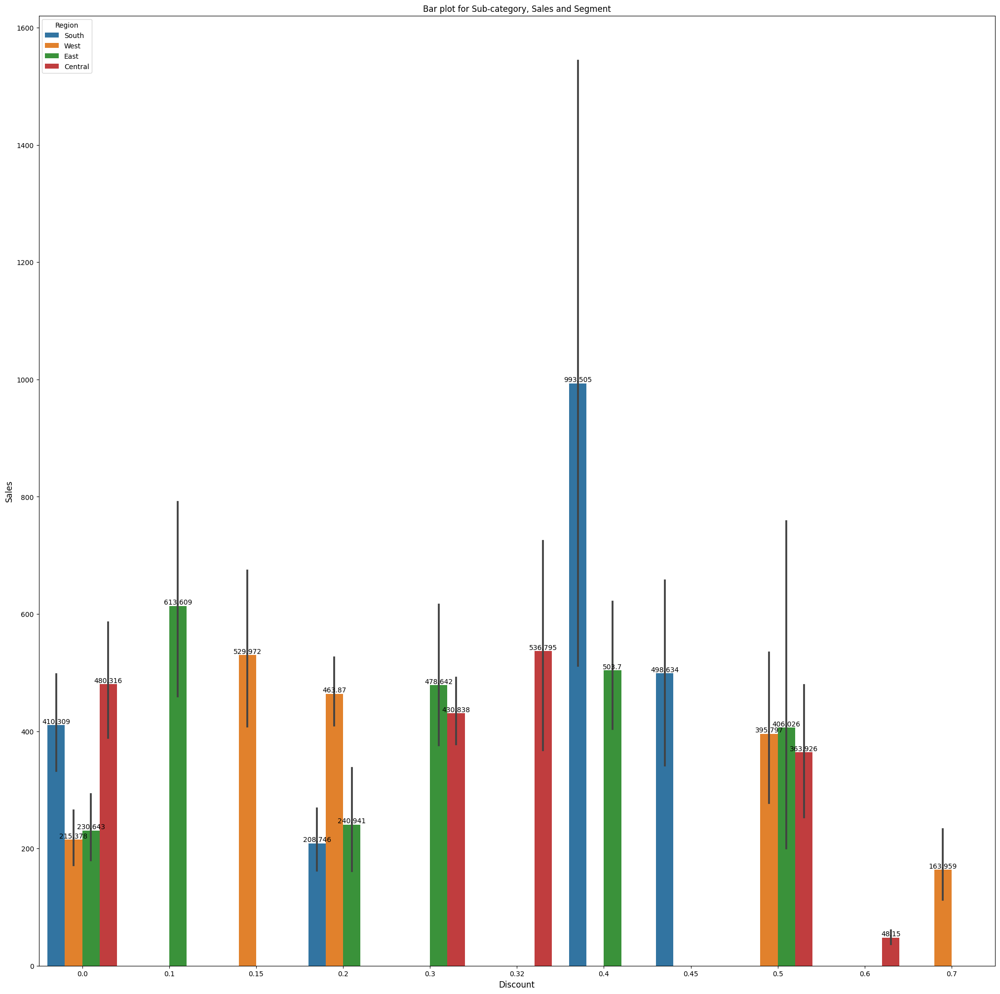

In [33]:
plt.figure(figsize=(25,25))
ax=sns.barplot(data=data_01, x='Discount', y='Sales',hue='Region')
for container in ax.containers:
    ax.bar_label(container)
plt.xlabel("Discount", fontsize = 12)
plt.ylabel("Sales", fontsize = 12)
plt.title('Bar plot for Sub-category, Sales and Segment')
plt.show()

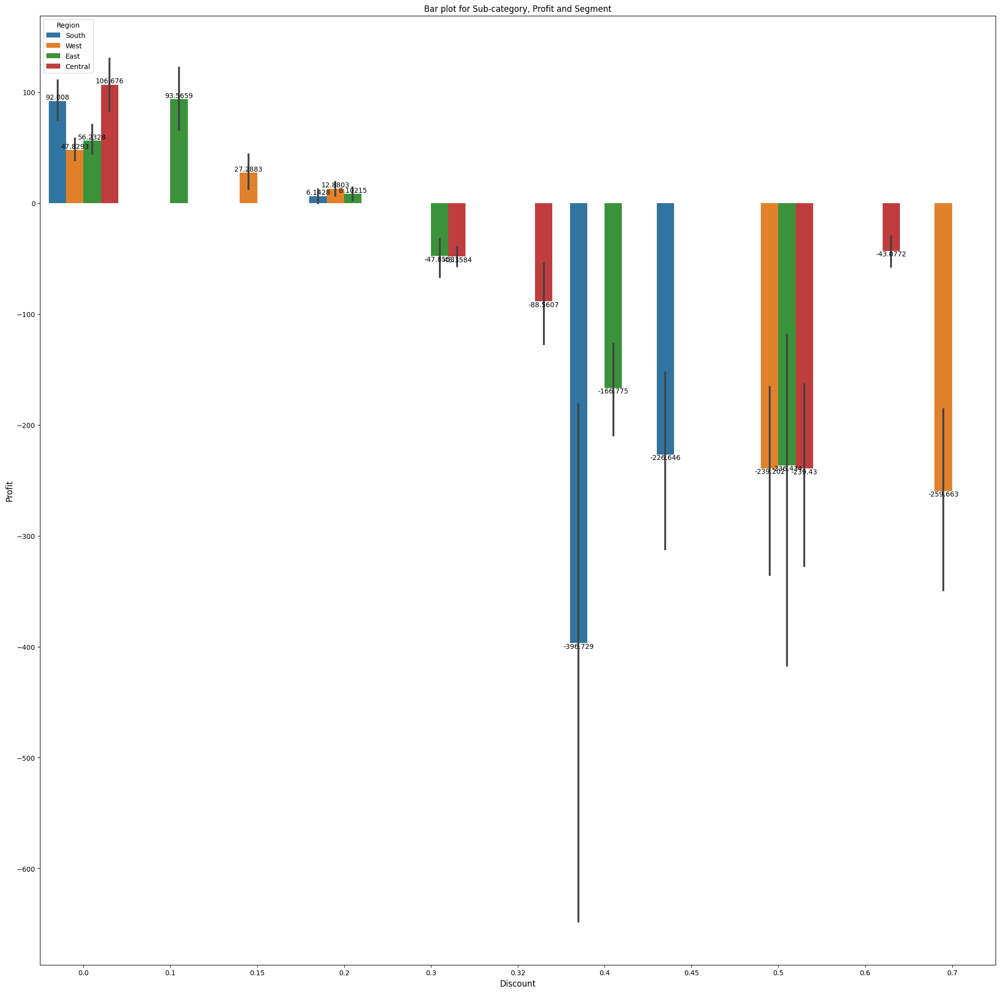

In [34]:
plt.figure(figsize=(25,25))
ax=sns.barplot(data=data_01, x='Discount', y='Profit',hue='Region')
for container in ax.containers:
    ax.bar_label(container)
plt.xlabel("Discount", fontsize = 12)
plt.ylabel("Profit", fontsize = 12)
plt.title('Bar plot for Sub-category, Profit and Segment')
plt.show()

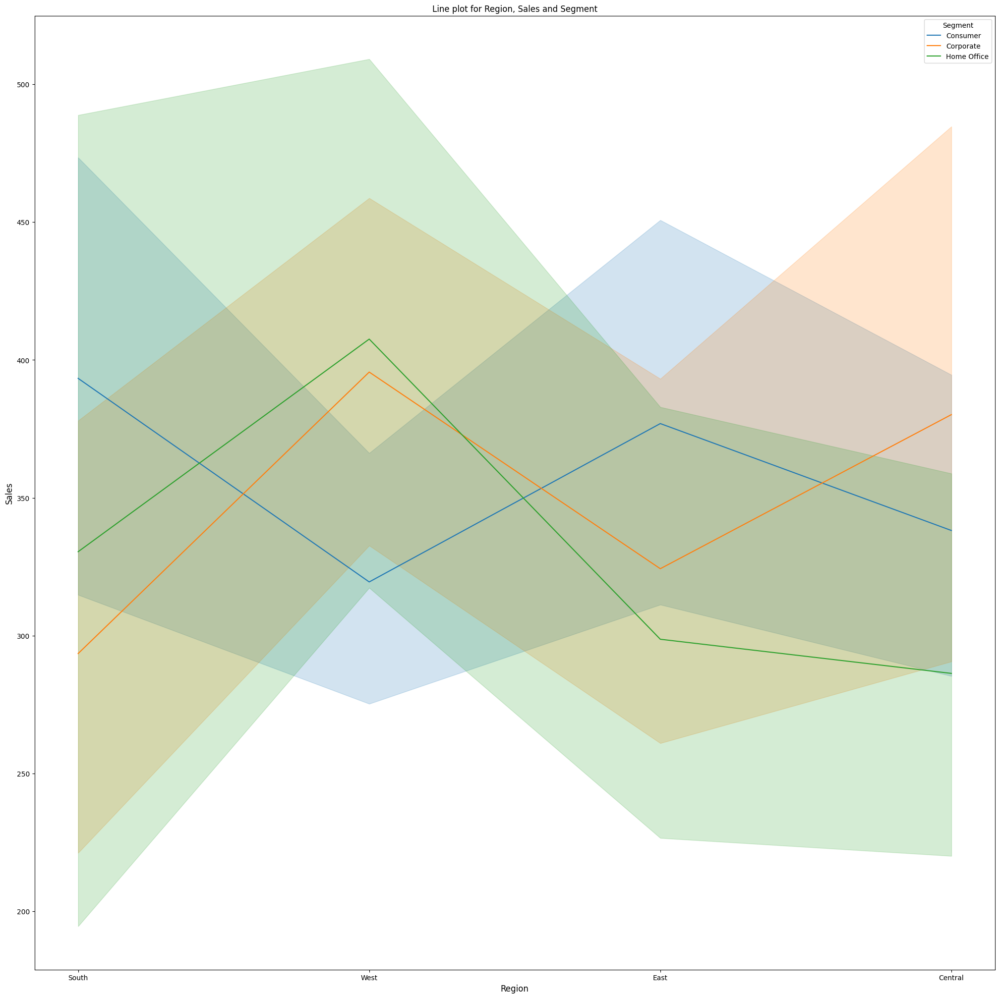

In [35]:
plt.figure(figsize=(25,25))
sns.lineplot(data=data_01,x='Region',y='Sales',hue='Segment')
plt.xlabel("Region", fontsize = 12)
plt.ylabel("Sales", fontsize = 12)
plt.title('Line plot for Region, Sales and Segment')
plt.show()

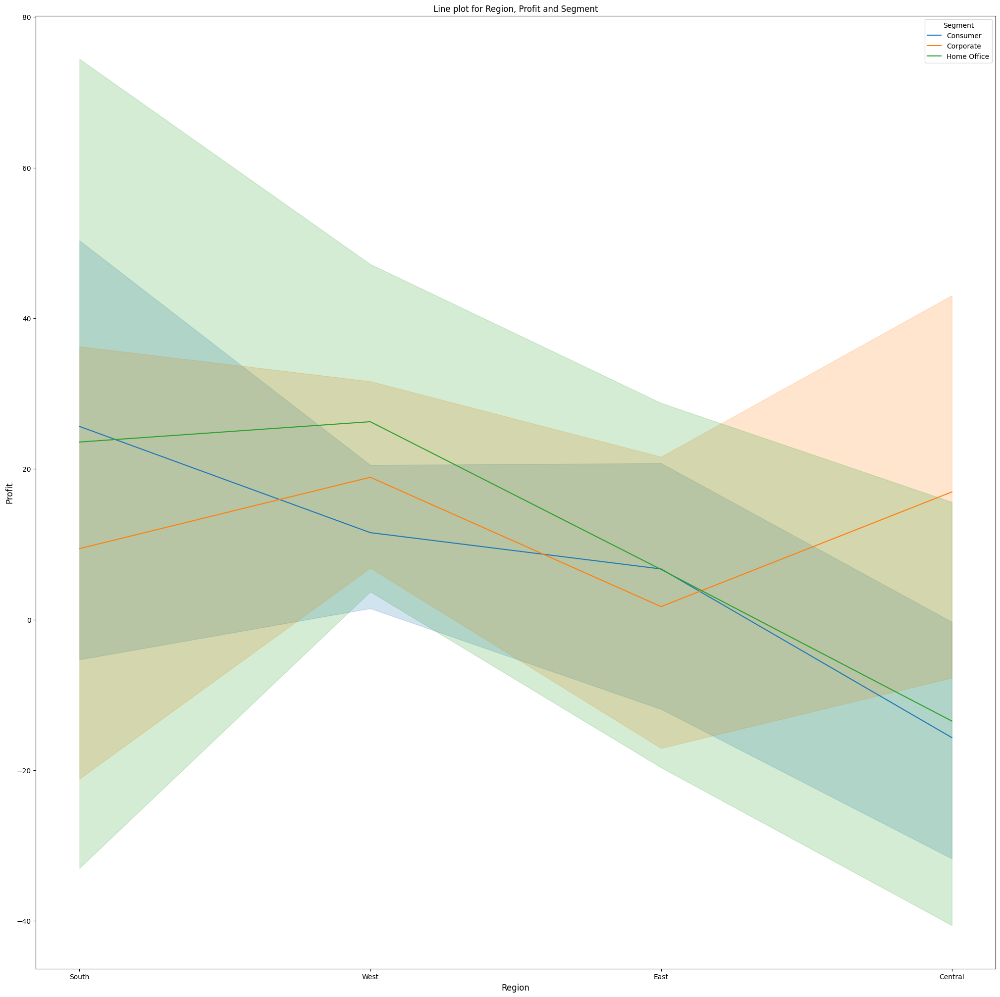

In [36]:
plt.figure(figsize=(25,25))
sns.lineplot(data=data_01,x='Region',y='Profit',hue='Segment')
plt.xlabel("Region", fontsize = 12)
plt.ylabel("Profit", fontsize = 12)
plt.title('Line plot for Region, Profit and Segment')
plt.show()

* **Interpretation:-**
  * For 'Home Office Segment' the Sales and profits are highest in the 'West Region' and least in 'Central region'.
  * For 'Corporate Segment' the Sales are highest in 'West region' and least in 'South region' and profits are 
  highest in 'Central region' and least in 'East region'.
  * For 'Consumer Segment' the Sales are highest in 'south region' and least in 'West region' and profits are 
  highest in 'South region' and least in 'Central region'.

#Data Preprocessing 

In [37]:
data_02 = data_01[['Order Date','Sales']]

In [38]:
data_02

,Order Date,Sales
0,11/8/2016,261.9600
1,11/8/2016,731.9400
3,10/11/2015,957.5775
5,6/9/2014,48.8600
10,6/9/2014,1706.1840
...,...,...
9962,3/19/2015,383.4656
9964,12/5/2016,13.4000
9980,9/6/2015,85.9800
9989,1/21/2014,25.2480


In [39]:
data_02.columns

Index(['Order Date', 'Sales'], dtype='object')

Setting Index as Order Date

In [40]:
data_02['Order Date'] = pd.to_datetime(data_02['Order Date'])

<ipython-input-40-257c395d3e14>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_02['Order Date'] = pd.to_datetime(data_02['Order Date'])


In [41]:
data_02 = data_02.set_index('Order Date')

In [42]:
data_02.sample(10)

,Sales
Order Date,
2014-06-04,353.568
2016-08-23,532.704
2016-12-25,2563.056
2017-03-18,82.524
2015-07-20,384.944
2014-05-10,256.784
2015-04-27,1267.530
2016-12-24,43.960
2014-03-18,30.768


Separting the required Features

In [43]:
data_03 = data_02[["Sales"]]

In [44]:
data_03.sample(10)

,Sales
Order Date,
2017-12-25,191.984
2014-09-26,145.568
2017-09-02,254.526
2015-05-31,51.560
2014-09-28,337.088
2017-11-16,119.940
2014-09-20,493.430
2016-01-30,48.580
2016-11-21,77.952


Plotting the sales with Order Date

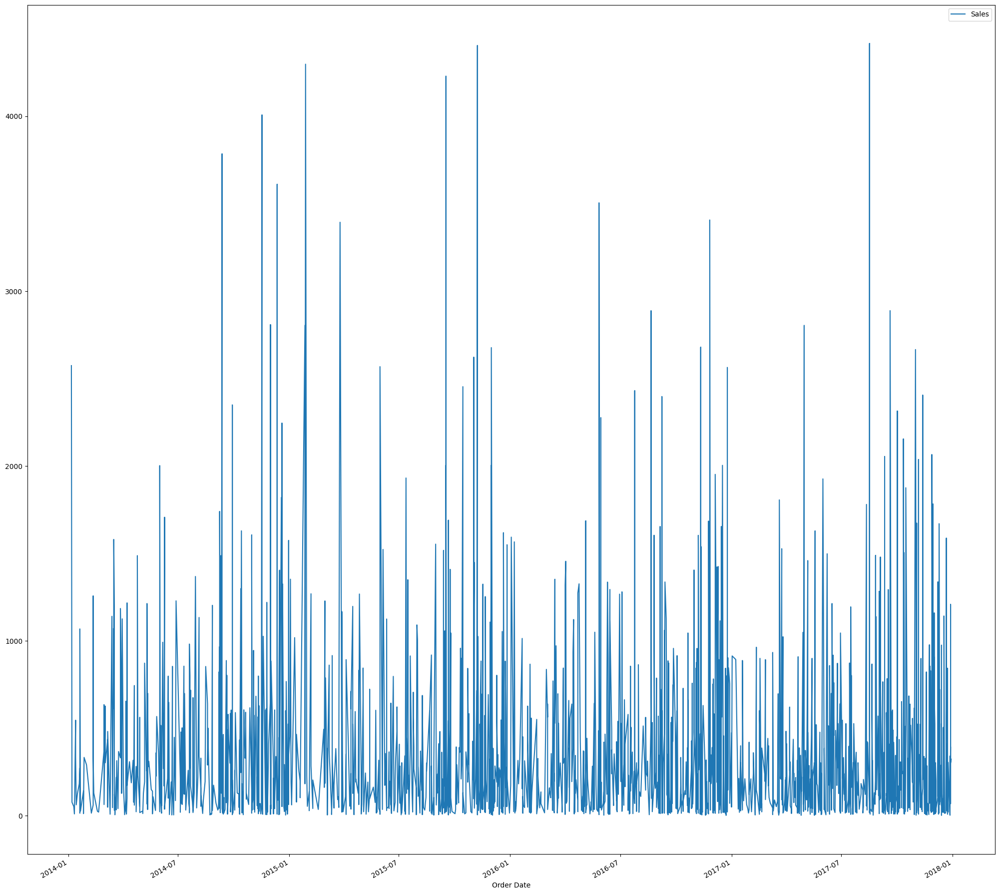

In [45]:
data_03.plot(figsize=(25,25))
plt.show()

**Resampling the Data to Weekly Data using the Mean Function**

In [46]:
data_04 = data_02.resample("W").mean()

In [47]:
data_04.sample(10)

,Sales
Order Date,
2015-10-25,332.627727
2014-08-24,311.196000
2015-12-06,437.122043
2016-11-20,213.844308
2014-02-16,444.904500
2015-09-13,258.120824
2014-07-06,237.072000
2016-10-16,148.815000
2017-11-05,372.645217


In [48]:
data_04.shape

(208, 1)

In [49]:
data_04.isnull().sum()

Sales    0
dtype: int64

In [50]:
data_04.dropna(inplace=True)

In [51]:
data_04.isnull().sum()

Sales    0
dtype: int64

* Interpretation:-No null values after resampling the data to weekly data

Plotting the Sales with Order Date After Resampling to Weekly Data.

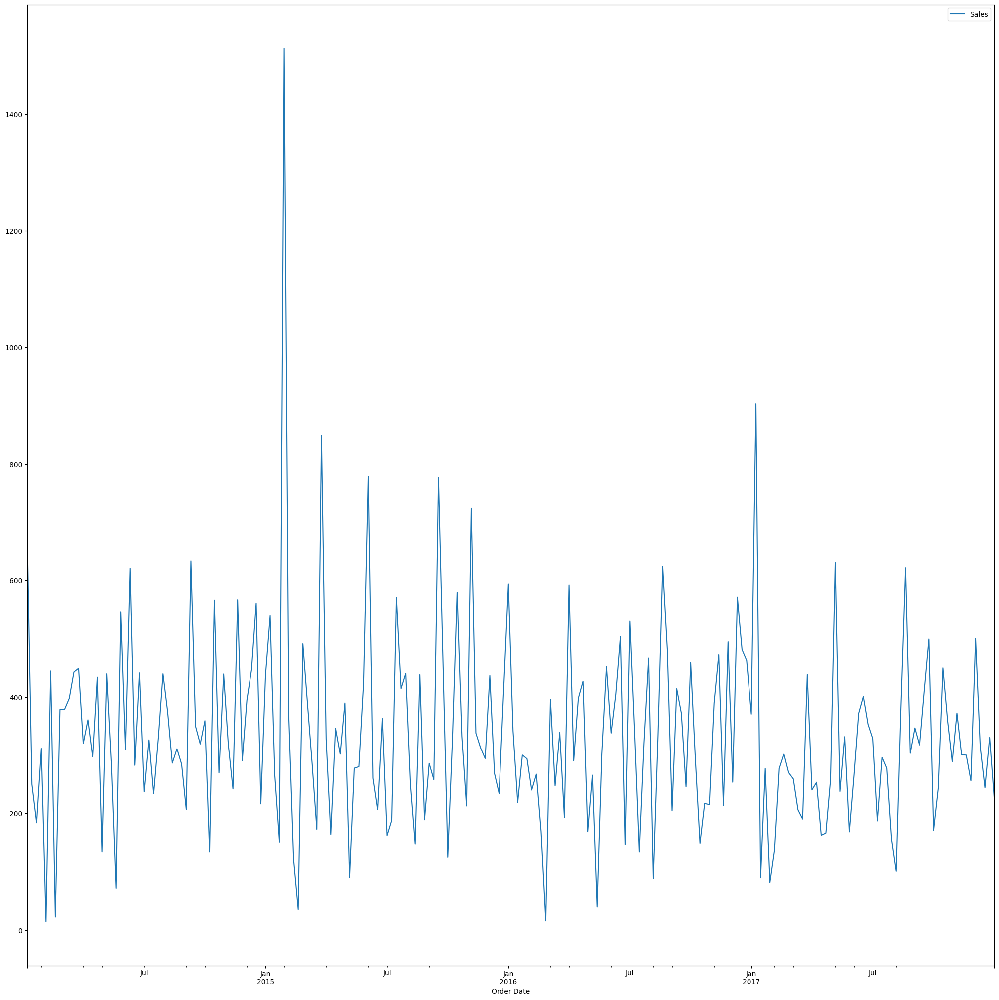

In [52]:
data_04.plot(figsize=(25,25))
plt.show()

In [53]:
decomp = seasonal_decompose(data_04,period=7)

In [54]:
trend = decomp.trend
seasonal = decomp.seasonal
residual = decomp.resid

##Plots for Seasonal Components

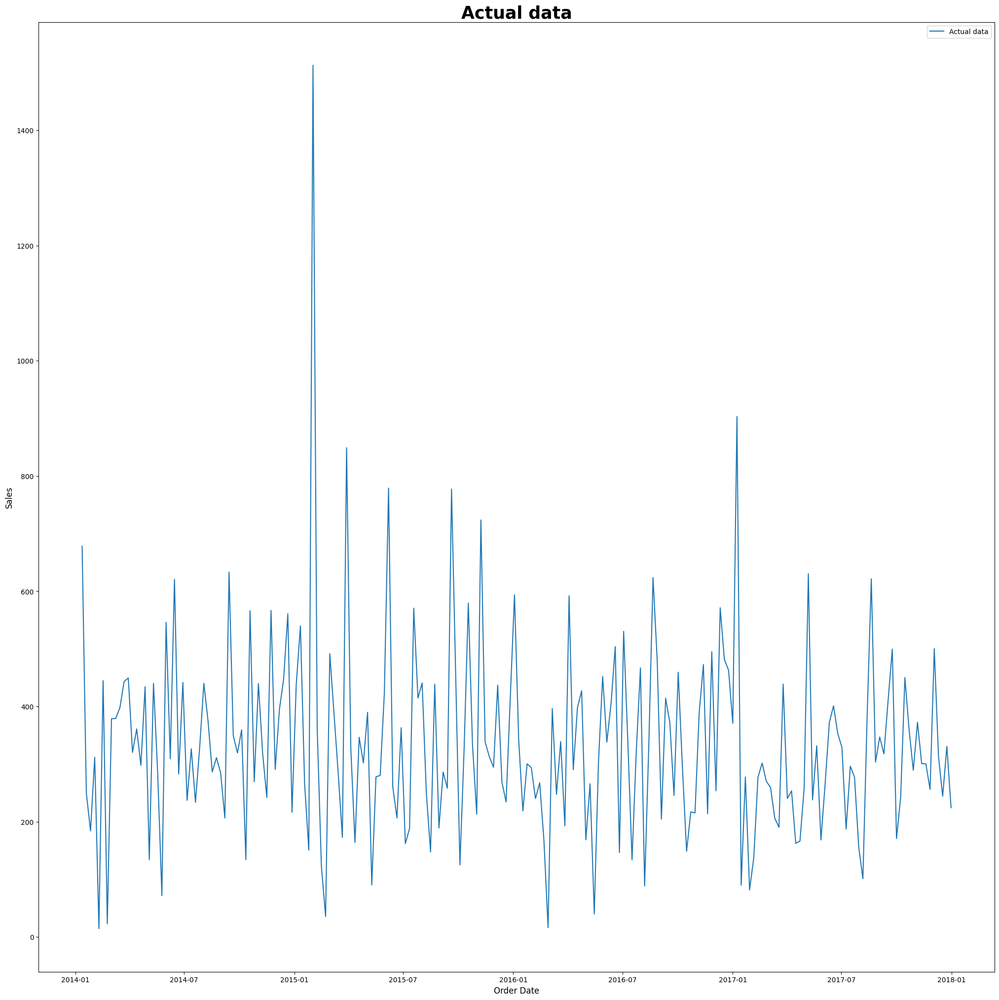

In [55]:
plt.figure(figsize=(25,25))
plt.plot(data_04["Sales"],label="Actual data")
plt.xlabel("Order Date", fontsize = 12)
plt.ylabel("Sales", fontsize = 12)
plt.title('Actual data',fontsize=25,fontweight="bold")
plt.legend(loc='best')
plt.show()

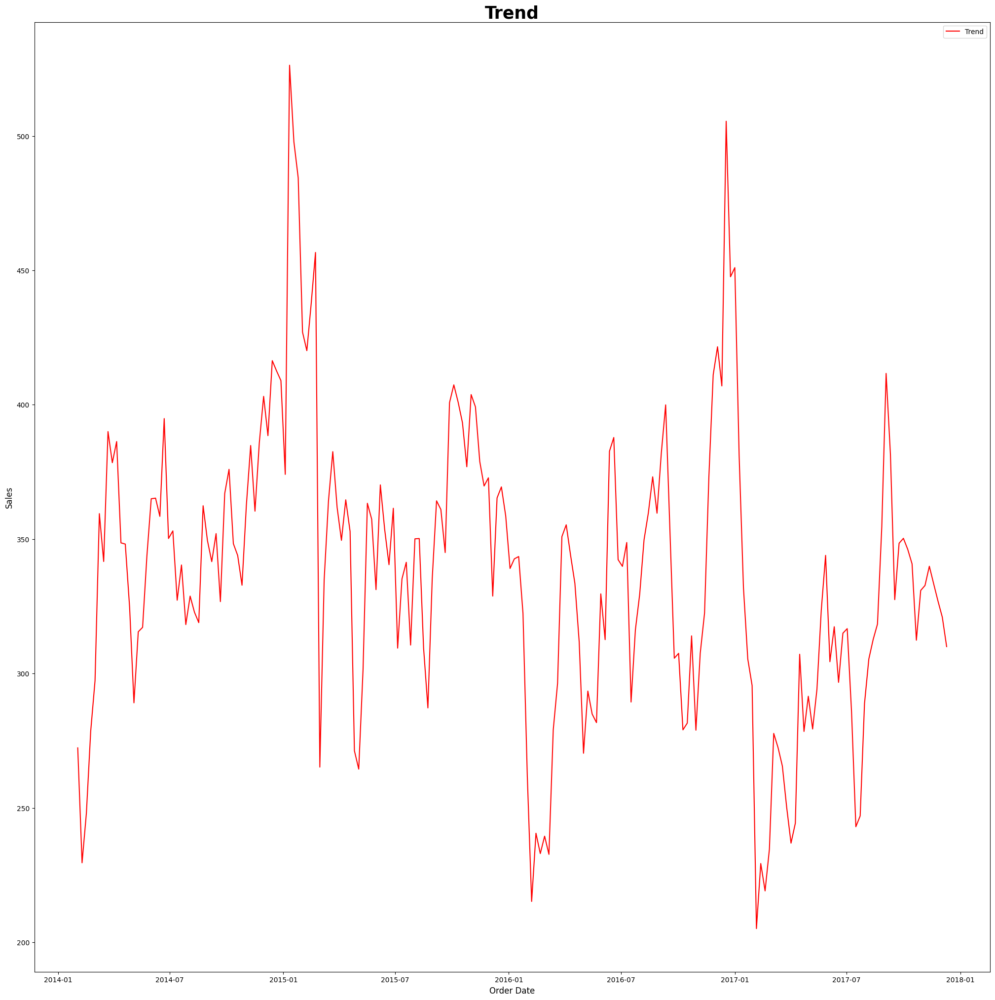

In [56]:
plt.figure(figsize=(25,25))
plt.plot(trend,color="r",label = "Trend")
plt.xlabel("Order Date", fontsize = 12)
plt.ylabel("Sales", fontsize = 12)
plt.title('Trend',fontsize=25,fontweight="bold")
plt.legend(loc='best')
plt.show()

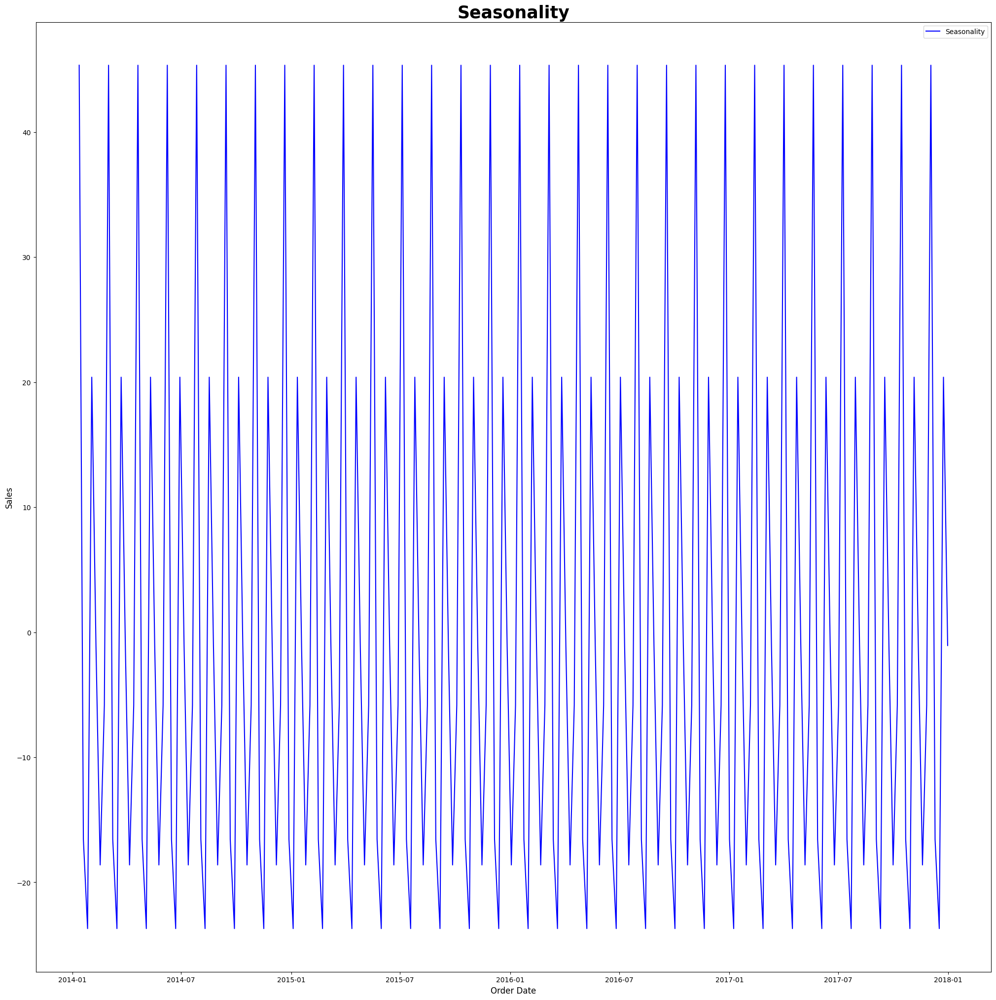

In [57]:
plt.figure(figsize=(25,25))
plt.plot(seasonal,color="b",label = "Seasonality")
plt.xlabel("Order Date", fontsize = 12)
plt.ylabel("Sales", fontsize = 12)
plt.title('Seasonality',fontsize=25,fontweight="bold")
plt.legend(loc='best')
plt.show()

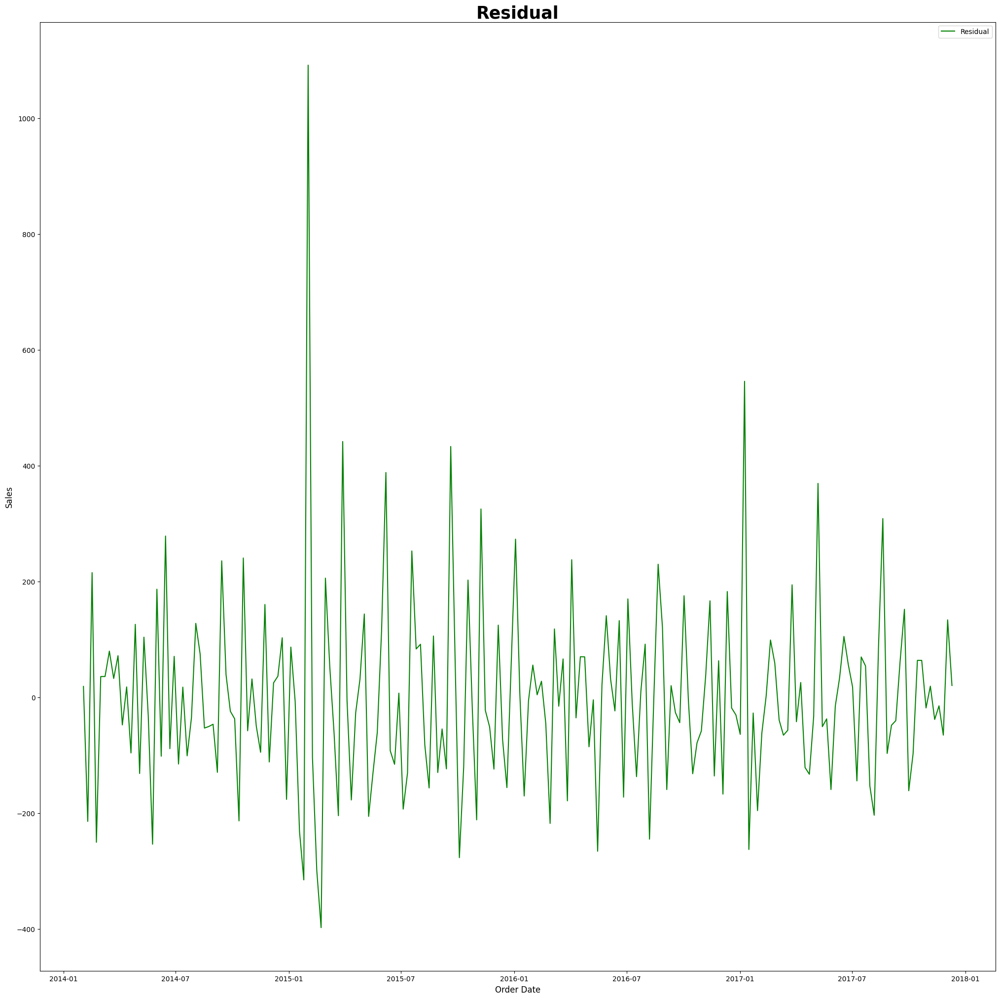

In [58]:
plt.figure(figsize=(25,25))
plt.plot(residual,color="g",label = "Residual")
plt.xlabel("Order Date", fontsize = 12)
plt.ylabel("Sales", fontsize = 12)
plt.title('Residual',fontsize=25,fontweight="bold")
plt.legend(loc='best')
plt.show()

*  **Interpretation:-**
      * From the graph-1 we can see the actual data in which trend,     seasonality and noise are present.
      * From graph-2 we can see the upward trend.
      * From graph-3 we can see the Seasonality present in the data.
      * from graph-4 we can see the presence of noise in the data.

##Moving Aveage

In [59]:
moving_av = []
for i in [3,6,9,12]:
    moving_avg = data_04.rolling(window=i).mean()
    moving_av.append(moving_avg)

Creating a DataFrame for Assigning the Actual Data and Moving Averages

In [60]:
data_05 = pd.DataFrame()
data_05['Actual_data'] = data_04
data_05['Moving_average3'] = moving_av[0]
data_05['Moving_average6'] = moving_av[1]
data_05['Moving_average9'] = moving_av[2]
data_05['Moving_average12'] = moving_av[3]

In [61]:
data_05.sample(10)

,Actual_data,Moving_average3,Moving_average6,Moving_average9,Moving_average12
Order Date,,,,,
2015-05-17,277.787250,252.693911,261.764751,324.487802,340.357889
2016-12-04,253.640208,320.815944,340.048959,300.101632,314.849066
2015-06-07,778.959000,494.351414,373.522662,339.293639,366.953705
2014-04-06,320.288857,404.323159,394.817390,316.789871,299.752648
2014-01-12,678.107000,NaN,NaN,NaN,NaN
2016-06-19,503.915900,415.670408,340.258066,322.564958,348.626131
2016-05-15,39.865333,158.068937,264.958439,301.547926,281.163882
2017-12-03,500.255375,352.226920,336.565812,341.401676,346.121267
2015-09-06,286.155500,304.664500,292.033648,325.099040,304.794398


###Plotting for Actual and Different Lags

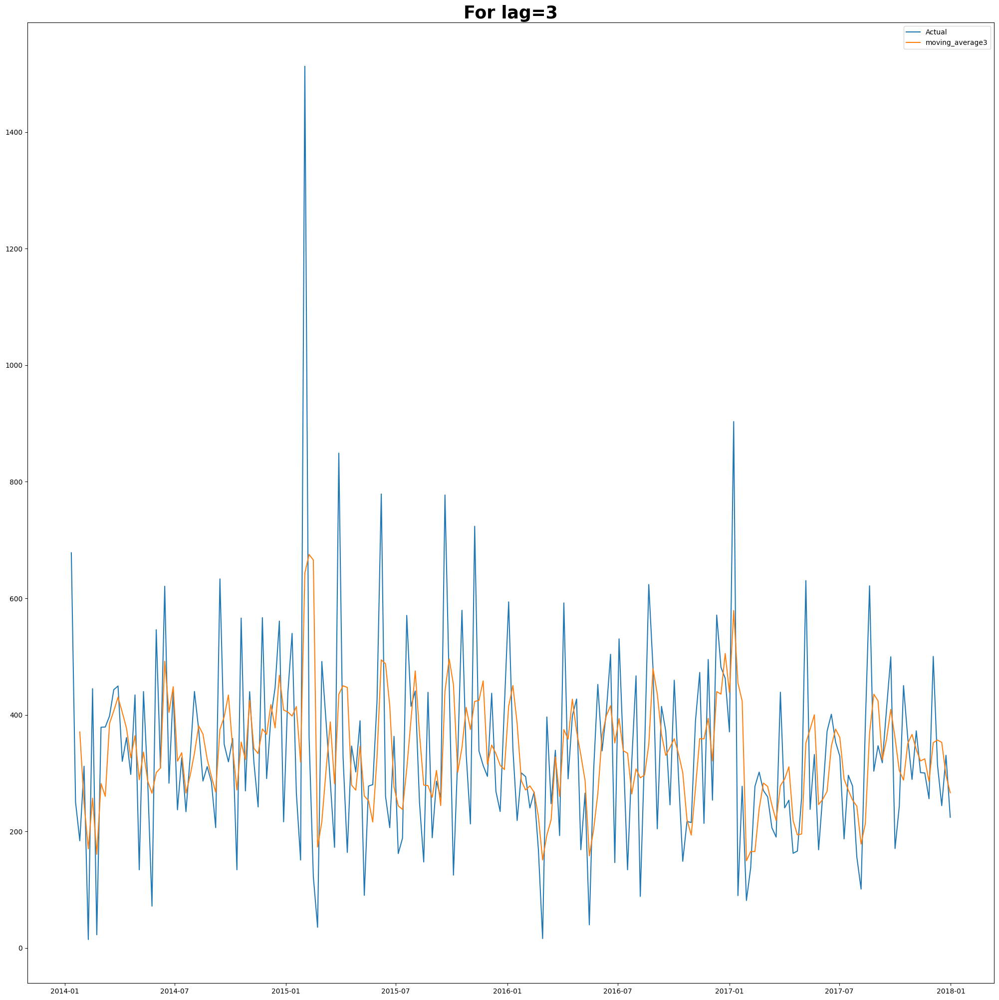

In [62]:
plt.figure(figsize=(25,25))
plt.plot(data_05['Actual_data'],label='Actual')
plt.plot(data_05['Moving_average3'],label='moving_average3')
plt.title('For lag=3',fontsize=25,fontweight="bold")
plt.legend(loc='best')
plt.show()

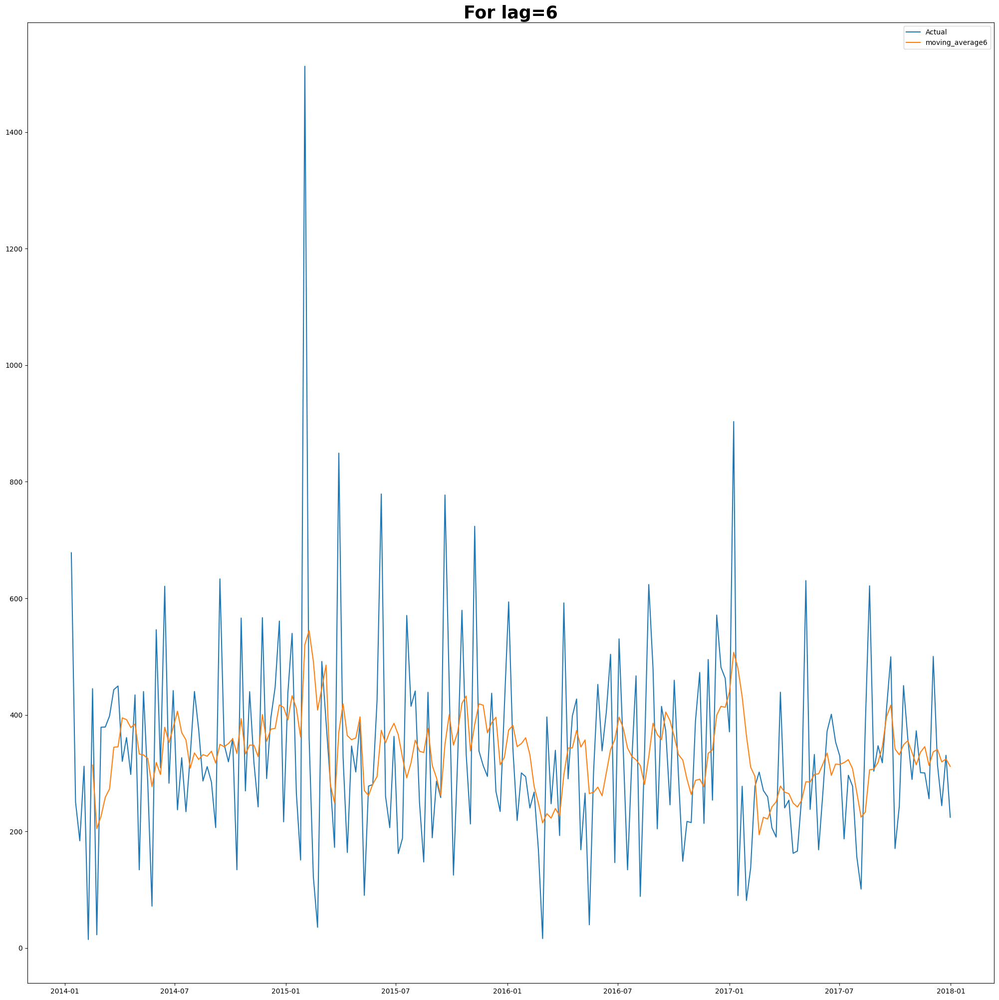

In [63]:
plt.figure(figsize=(25,25))
plt.plot(data_05['Actual_data'],label='Actual')
plt.plot(data_05['Moving_average6'],label='moving_average6')
plt.title('For lag=6',fontsize=25,fontweight="bold")
plt.legend(loc='best')
plt.show()

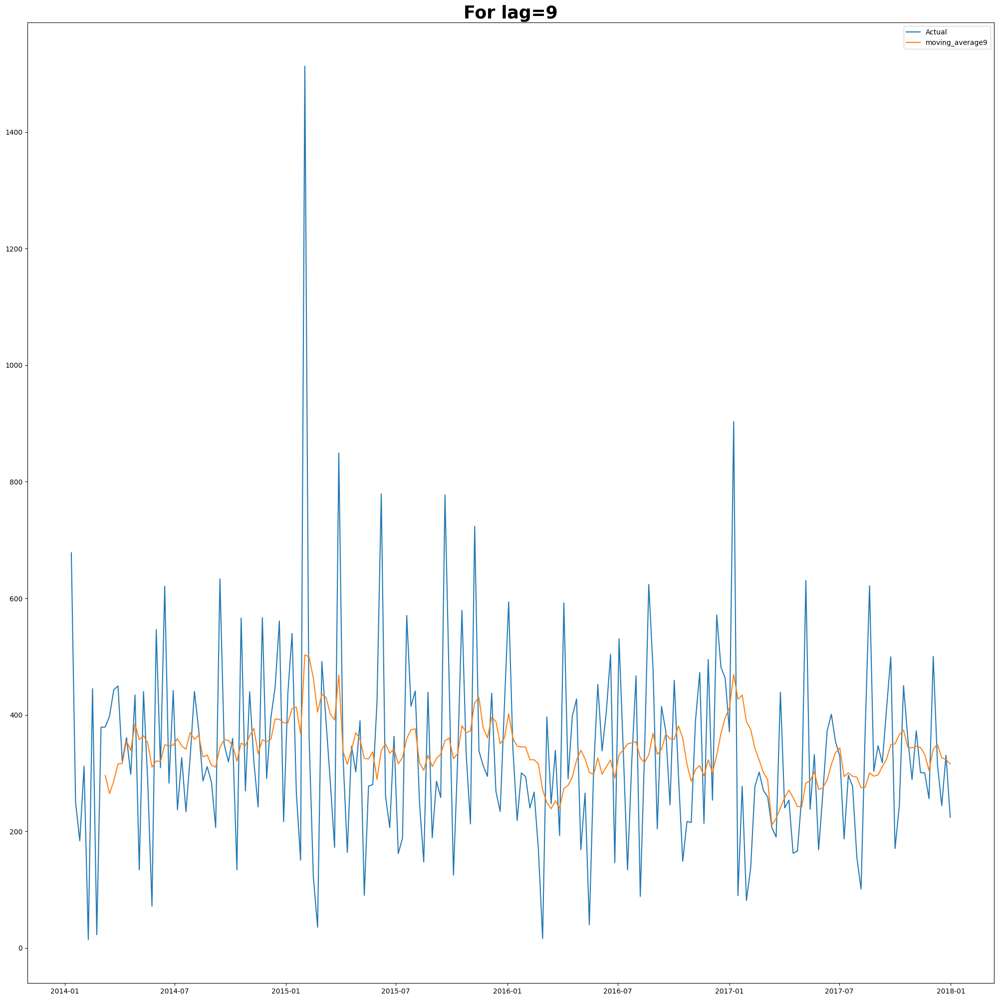

In [64]:
plt.figure(figsize=(25,25))
plt.plot(data_05['Actual_data'],label='Actual')
plt.plot(data_05['Moving_average9'],label='moving_average9')
plt.title('For lag=9',fontsize=25,fontweight="bold")
plt.legend(loc='best')
plt.show()

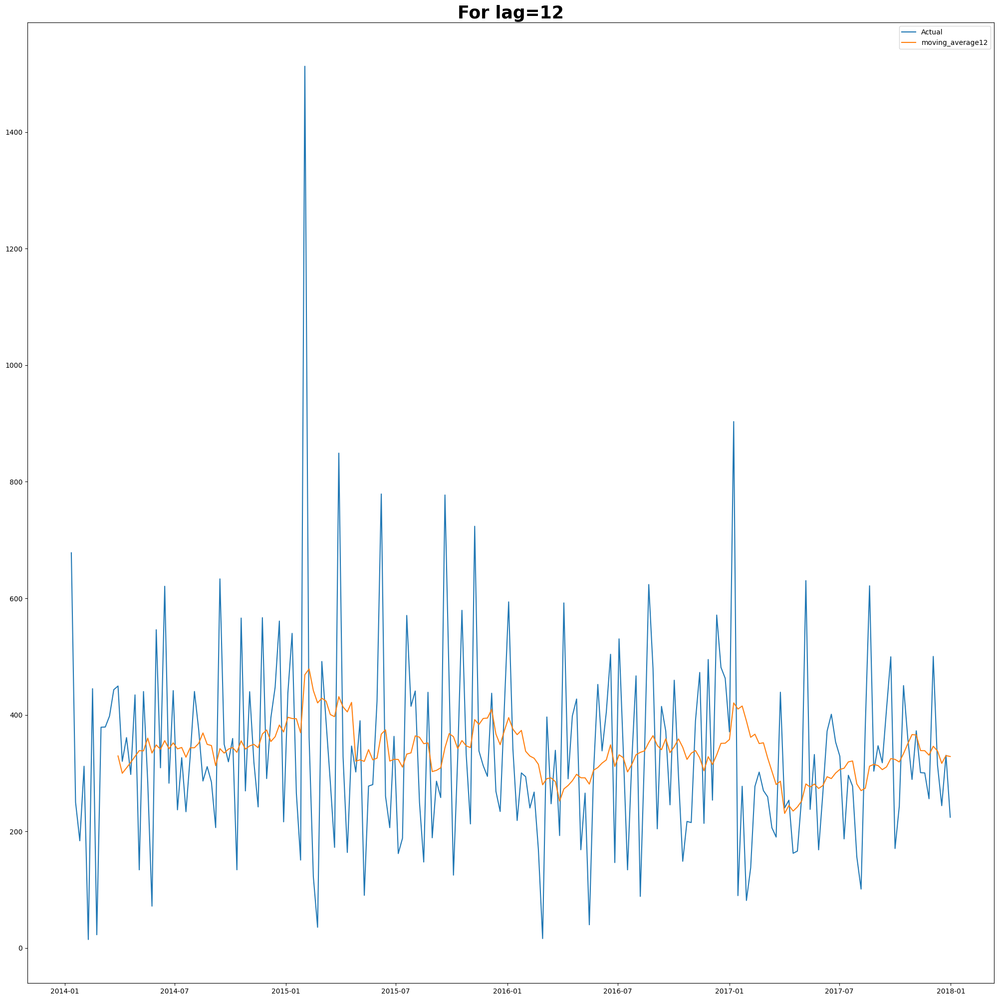

In [65]:
plt.figure(figsize=(25,25))
plt.plot(data_05['Actual_data'],label='Actual')
plt.plot(data_05['Moving_average12'],label='moving_average12')
plt.title('For lag=12',fontsize=25,fontweight="bold")
plt.legend(loc='best')
plt.show()

#Smoothing

In [66]:
data_06 = data_04["Sales"]

In [67]:
data_06.sample(10)

Order Date
2015-04-26    302.014167
2016-08-28    479.651089
2014-06-22    282.732514
2016-12-18    481.575941
2017-12-31    224.309156
2017-03-19    190.329200
2014-06-15    620.649429
2014-11-16    242.079606
2015-02-15    122.352000
2017-07-23    277.639813
Name: Sales, dtype: float64

##Simple Exponential Smoothing

In [68]:
def simplesmoothing(data,alpha):
    Model = SimpleExpSmoothing(data).fit(smoothing_level = alpha)
    fcast  = Model.fittedvalues
    data = pd.DataFrame({"Actual":data_06,"Forecast":fcast})
    return (Model,data)

In [69]:
alpha = [0.0,0.2,0.4,0.6,0.8]
data_simpleexp = {}
Models = []

In [70]:
for a in alpha:
    m,d = simplesmoothing(data_04["Sales"],a)
    data_simpleexp[a] = d.Forecast
    Models.append(m)

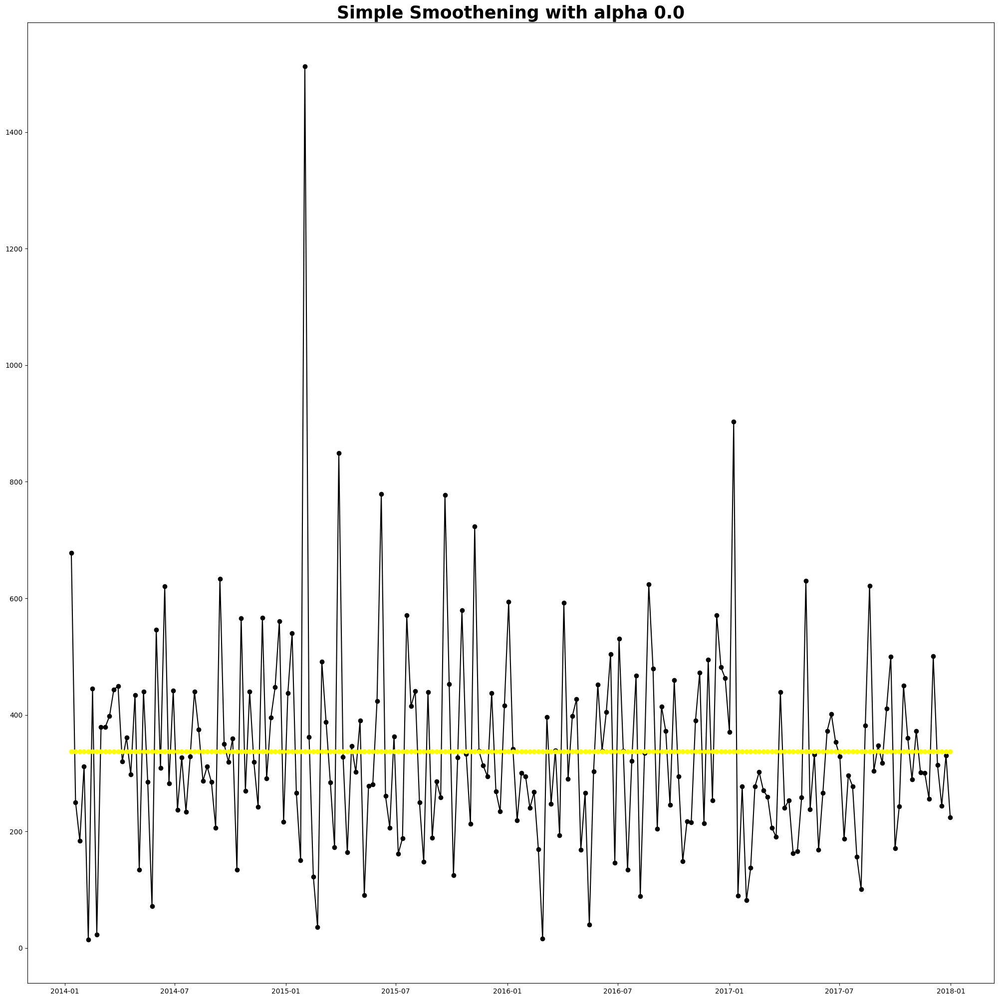

In [71]:
plt.figure(figsize=(25,25))
plt.plot(data_06, marker='o', color='black',label='Actual Close Price')
plt.plot(data_simpleexp.get(0.0), marker='o', color='yellow',label='alpha=0.0')
plt.title('Simple Smoothening with alpha 0.0',fontsize=25,fontweight="bold")
plt.show()

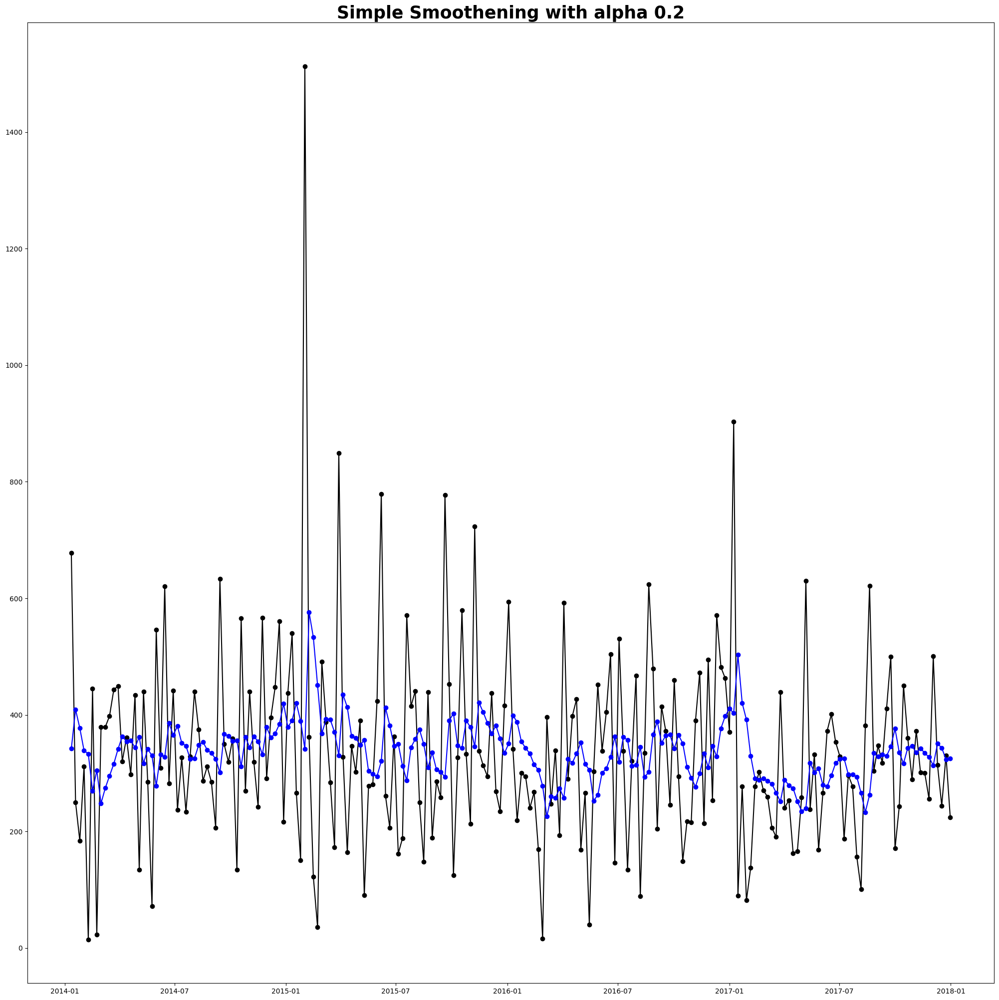

In [72]:
plt.figure(figsize=(25,25))
plt.plot(data_06, marker='o', color='black',label='Actual Close Price')
plt.plot(data_simpleexp.get(0.2), marker='o', color='blue',label='alpha=0.0')
plt.title('Simple Smoothening with alpha 0.2',fontsize=25,fontweight="bold")
plt.show()

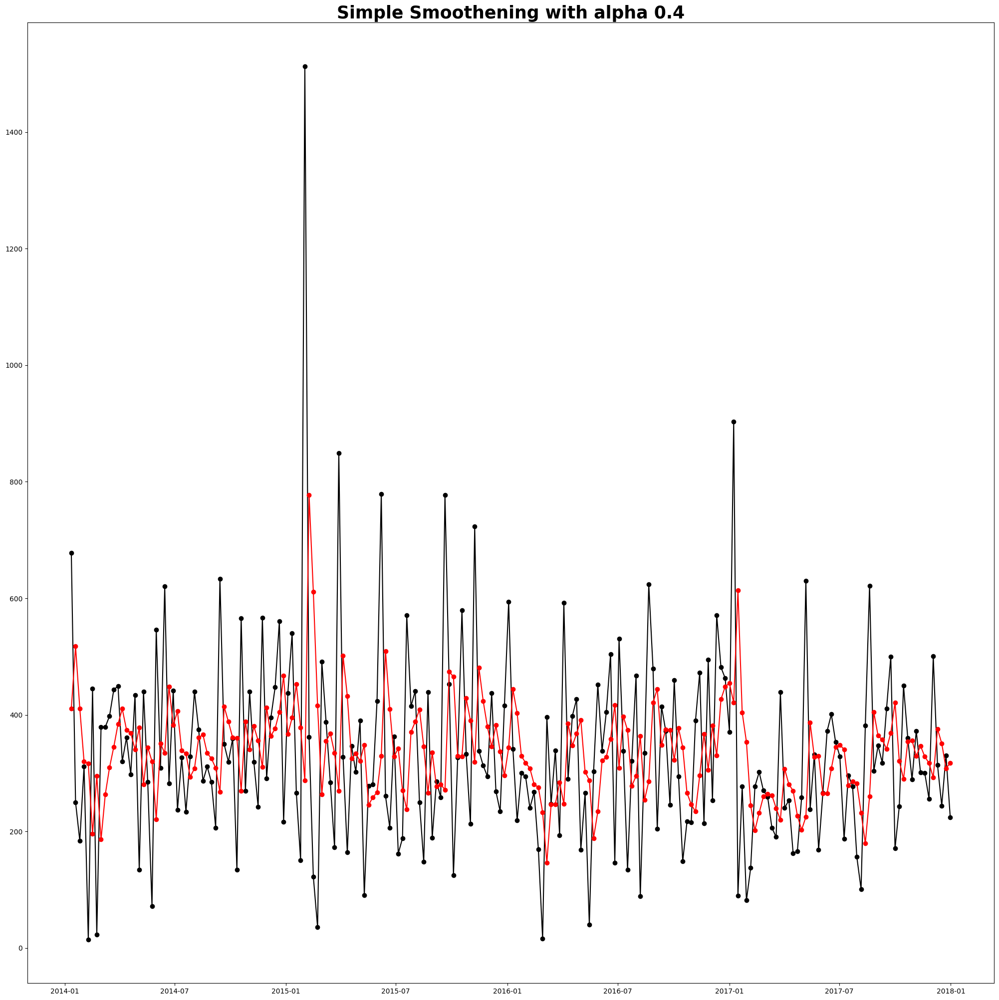

In [73]:
plt.figure(figsize=(25,25))
plt.plot(data_06, marker='o', color='black',label='Actual Close Price')
plt.plot(data_simpleexp.get(0.4), marker='o', color='red',label='alpha=0.0')
plt.title('Simple Smoothening with alpha 0.4',fontsize=25,fontweight="bold")
plt.show()

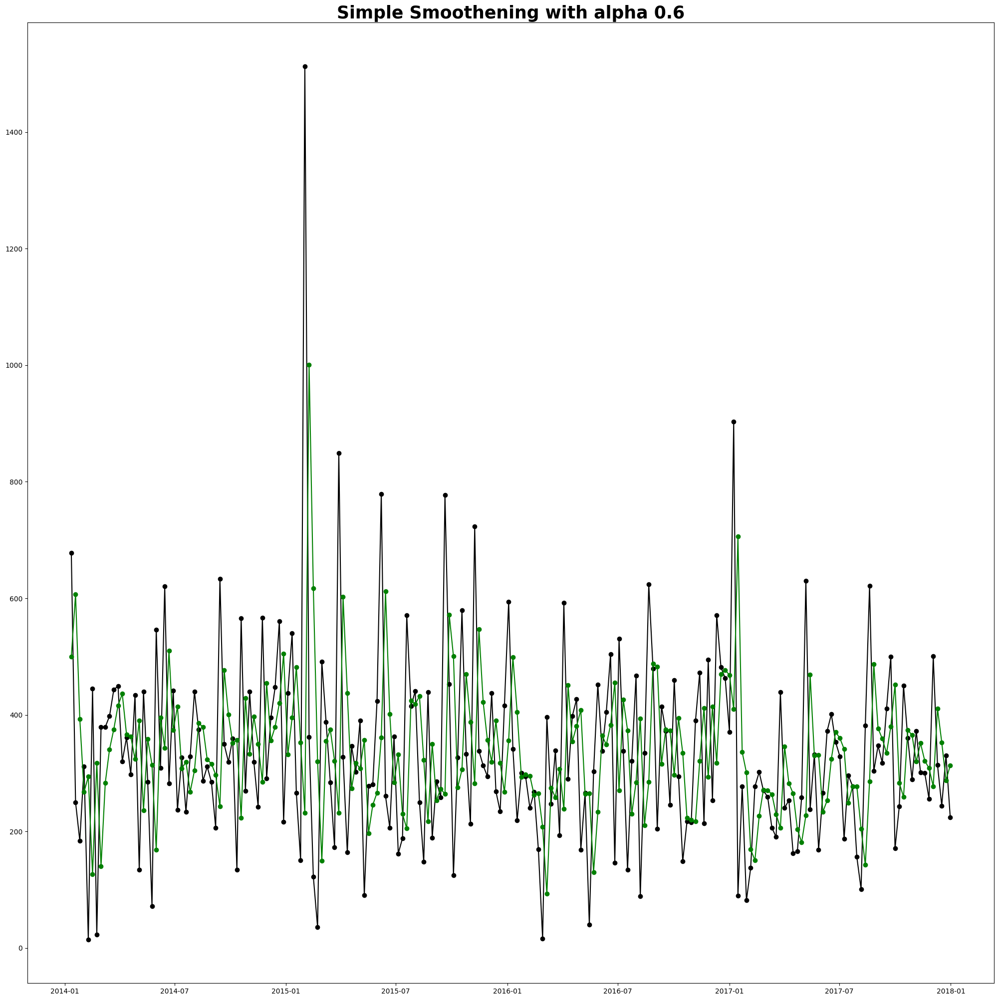

In [74]:
plt.figure(figsize=(25,25))
plt.plot(data_06, marker='o', color='black',label='Actual Close Price')
plt.plot(data_simpleexp.get(0.6), marker='o', color='green',label='alpha=0.0')
plt.title('Simple Smoothening with alpha 0.6',fontsize=25,fontweight="bold")
plt.show()

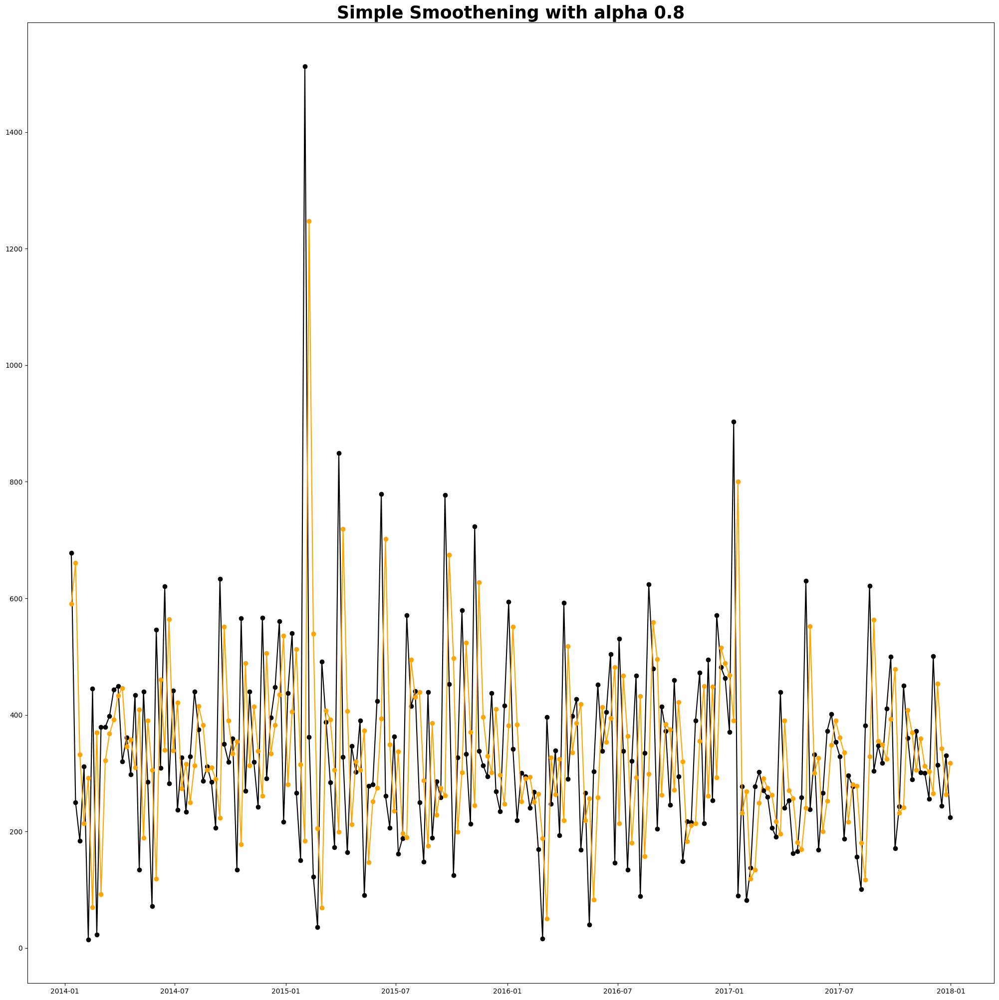

In [75]:
plt.figure(figsize=(25,25))
plt.plot(data_06, marker='o', color='black',label='Actual Close Price')
plt.plot(data_simpleexp.get(0.8), marker='o', color='orange',label='alpha=0.0')
plt.title('Simple Smoothening with alpha 0.8',fontsize=25,fontweight="bold")
plt.show()

* **Interpretation:-**
 * Here in Simple Exponential smoothening we can see that for the alpha value of 0.2, 
the forecast line gets smoothened.

For calculating errors

In [76]:
Model_01=SimpleExpSmoothing(data_06).fit(smoothing_level=0.2)
SimpleExpForcast = Model_01.fittedvalues

In [77]:
SimpleExpFrocast_RMSE = mean_squared_error(data_06,SimpleExpForcast,squared=False)
SimpleExpFrocast_RMSE

185.64325755279077

##Double Exponential Smoothing

In [78]:
Model_02 = ExponentialSmoothing(data_06,trend='Additive').fit(smoothing_level=0.2, smoothing_trend=0.35)

In [79]:
DoupbleExpForcast = Model_02.fittedvalues

In [80]:
DoupbleExpForcast

Order Date
2014-01-12    281.241366
2014-01-19    377.444334
2014-01-26    359.889747
2014-02-02    320.313616
2014-02-09    313.626600
                 ...    
2017-12-03    298.538947
2017-12-10    339.979608
2017-12-17    334.085671
2017-12-24    309.101623
2017-12-31    307.909417
Freq: W-SUN, Length: 208, dtype: float64

Plot the Original and Smoothened data

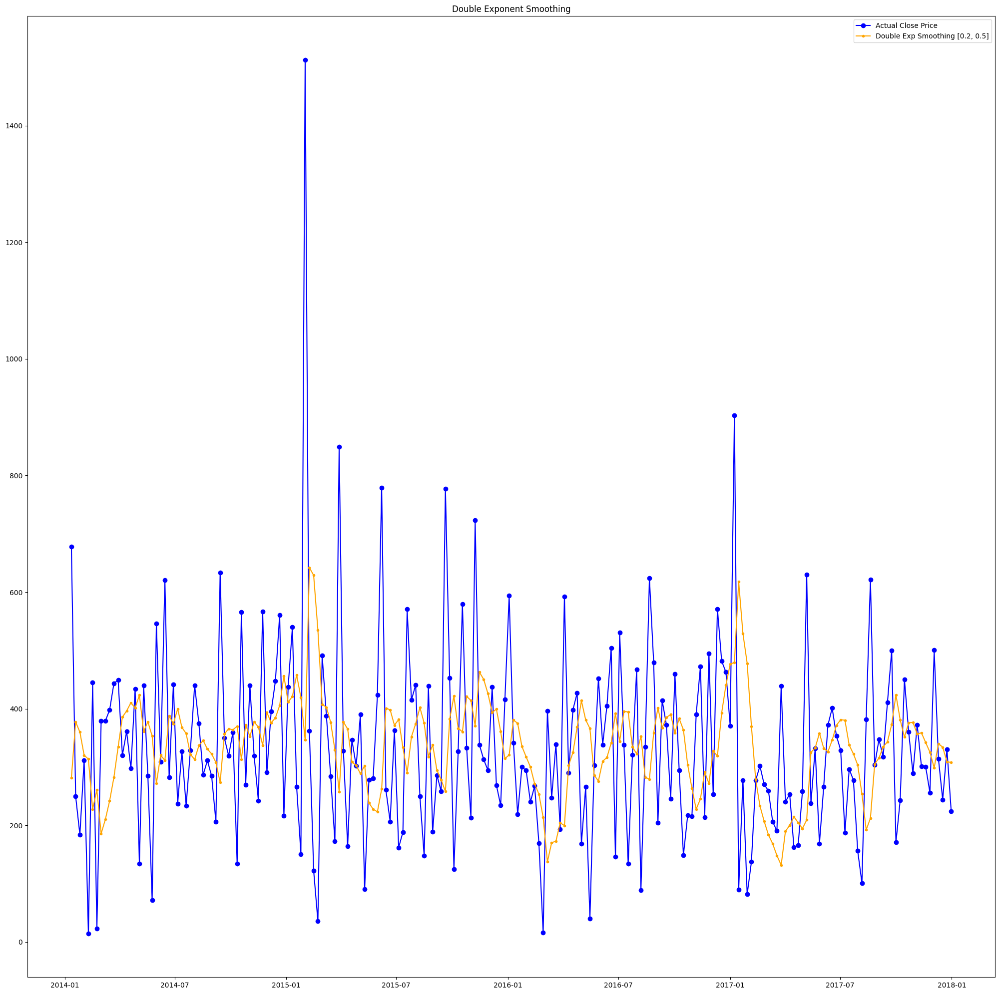

In [81]:
plt.figure(figsize=(25,25))
plt.plot(data_06,marker='o',color='blue',label='Actual Close Price')
plt.plot(DoupbleExpForcast, marker='.',color='orange',label='Double Exp Smoothing [0.2, 0.5]')
plt.legend()
plt.title('Double Exponent Smoothing')
plt.show()

In [82]:
DoubleExpFrocast_RMSE = mean_squared_error(data_06,DoupbleExpForcast,squared=False)
DoubleExpFrocast_RMSE

199.59717558417492

##Triple Exponential Smoothening

In [83]:
Model_03 = ExponentialSmoothing(data_06,trend='Additive',seasonal='Additive',seasonal_periods=7).fit(smoothing_level=0.2, smoothing_trend=0.35,smoothing_seasonal=0.5)

In [84]:
TripleExpForcast = Model_03.fittedvalues

In [85]:
TripleExpForcast

Order Date
2014-01-12    517.654316
2014-01-19    354.048084
2014-01-26    233.494070
2014-02-02    327.954073
2014-02-09     92.145887
                 ...    
2017-12-03    362.440579
2017-12-10    343.507612
2017-12-17    289.756530
2017-12-24    332.078639
2017-12-31    299.243832
Freq: W-SUN, Length: 208, dtype: float64

Plot the Original and Smoothened data

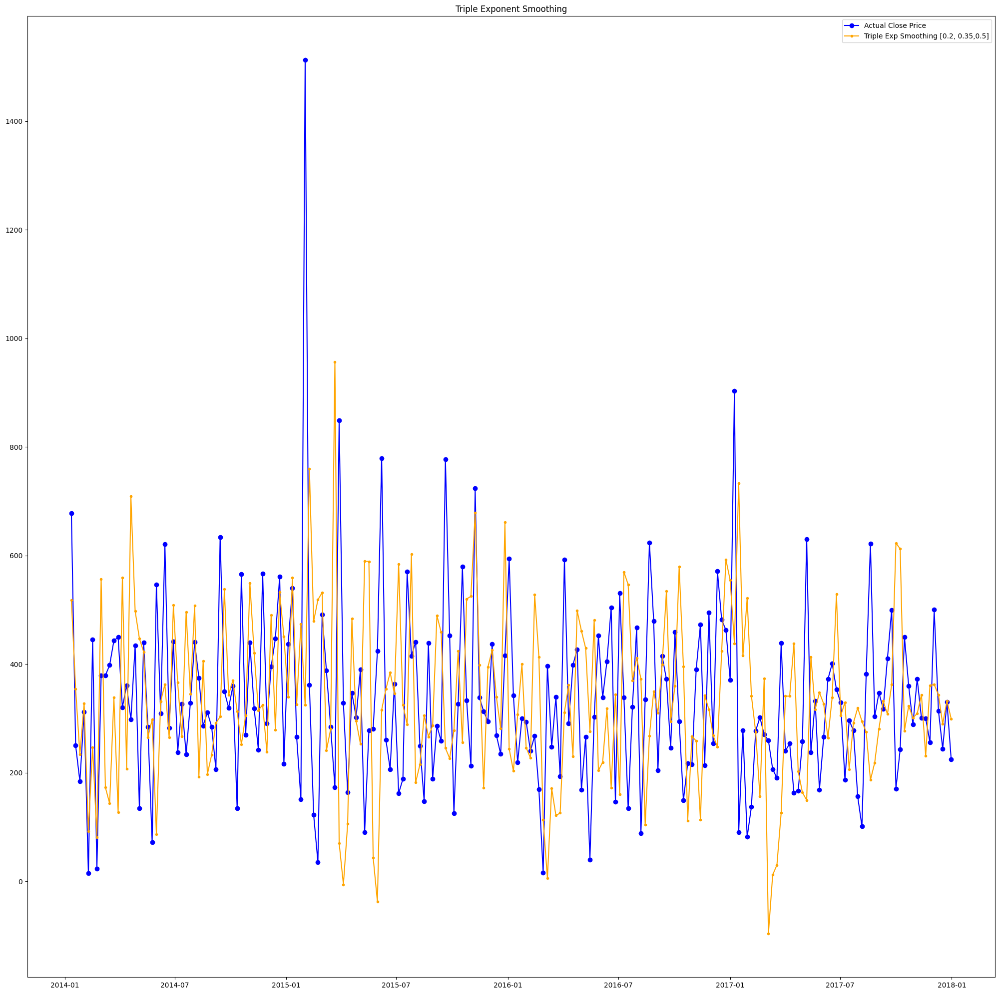

In [86]:
plt.figure(figsize=(25,25))
plt.plot(data_06,marker='o',color='blue',label='Actual Close Price')
plt.plot(TripleExpForcast, marker='.',color='orange',label='Triple Exp Smoothing [0.2, 0.35,0.5]')
plt.legend()
plt.title('Triple Exponent Smoothing')
plt.show()

In [87]:
TripleExpFrocast_RMSE = mean_squared_error(data_06,DoupbleExpForcast,squared=False)
TripleExpFrocast_RMSE

199.59717558417492

#Stationarity

Checking for Stationarity

In [88]:
def Stationarity(Data):
    P_value = adfuller(Data)[1]
    #print(P_value)
    if P_value < 0.05:
        a = 'Data is Stationary -> Proceed to Model Building'
    else:
        a = 'Data is not stationary. Make Data Stationary Then Proceed To Model Building'
        
    return(P_value,a)

In [89]:
Stationarity( data_04 )

(8.124101346205066e-22, 'Data is Stationary -> Proceed to Model Building')

##Plotting Autocorrelation and Partial Autocorrelation

<Figure size 2500x2500 with 0 Axes>

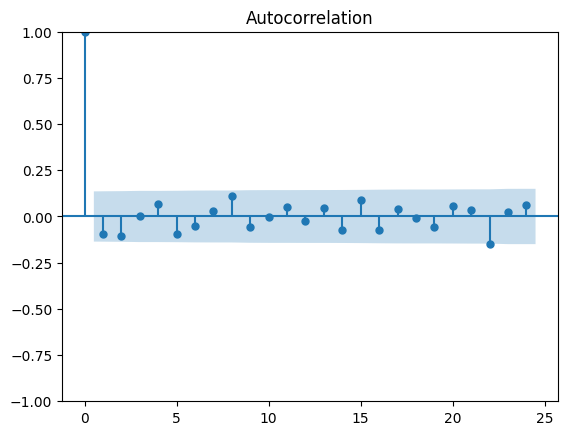

In [90]:
plt.figure(figsize=(25,25))
plot_acf(data_04)
plt.show()

/usr/local/lib/python3.9/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


<Figure size 2500x2500 with 0 Axes>

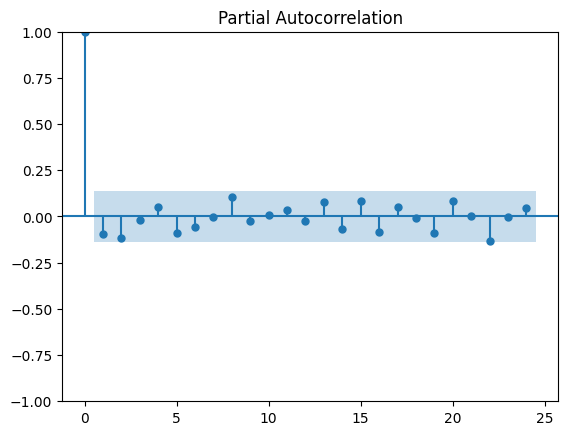

In [91]:
plt.figure(figsize=(25,25))
plot_pacf(data_04)
plt.show()

In [92]:
num = int(0.7*len(data_04))
train = data_04.iloc[:num]
test = data_04.iloc[num:]
train.shape,test.shape

((145, 1), (63, 1))

In [93]:
def arima_model(data):
    list1 = []
    for p in range(2):
        for q in range(2):
            list1.append((p,0,q))
            
    model = []
    for i in list1:
        m=ARIMA(train,order=i).fit()
        model.append(m)
        
    aic=[]
    bic=[]
    for j in model[0:]:
        aic.append(j.aic)
        bic.append(j.bic)
                
    forecast = []
    for v in model:
        f=v.predict(0,len(test)-1)
        forecast.append(f)
                    
    RMSE=[]
    for a in forecast[0:]:
        rmse = mean_squared_error(test,a,squared=False)
        RMSE.append(round(rmse,3))
        
        
    
    v1 = pd.DataFrame({'model':model,'p,d,q':list1,'RMSE':RMSE,'AIC':aic,'BIC':bic})
    
        
    return(v1)

In [94]:
data_07 = arima_model(train)

In [95]:
data_07

,model,"p,d,q",RMSE,AIC,BIC
0,<statsmodels.tsa.arima.model.ARIMAResultsWrapp...,"(0, 0, 0)",145.265,1928.240281,1934.193749
1,<statsmodels.tsa.arima.model.ARIMAResultsWrapp...,"(0, 0, 1)",143.753,1925.947630,1934.877831
2,<statsmodels.tsa.arima.model.ARIMAResultsWrapp...,"(1, 0, 0)",142.874,1927.436320,1936.366522
3,<statsmodels.tsa.arima.model.ARIMAResultsWrapp...,"(1, 0, 1)",143.134,1925.390514,1937.297449


In [96]:
data_07['RMSE'].min()

142.874

In [97]:
data_07[data_07.RMSE == data_07['RMSE'].min()]

,model,"p,d,q",RMSE,AIC,BIC
2,<statsmodels.tsa.arima.model.ARIMAResultsWrapp...,"(1, 0, 0)",142.874,1927.43632,1936.366522


In [98]:
stepfit = auto_arima(data_04['Sales'],start_p=0,max_p=3,start_q=0,max_q=4,trace=True,seasonal=True)

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2738.479, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2738.566, Time=0.20 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2738.023, Time=0.43 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=3061.955, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2741.195, Time=0.79 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2737.954, Time=0.65 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2740.230, Time=0.47 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=2739.946, Time=0.44 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=2741.794, Time=0.34 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=2934.784, Time=0.21 sec

Best model:  ARIMA(0,0,2)(0,0,0)[0] intercept
Total fit time: 3.727 seconds


#Model

## 1 -ARMA Model

In [99]:
def arima(data,p,d,q):
    m1 = ARIMA(data_06,order=(p,d,q)).fit()
    predictions = m1.predict(len(train),len(train)+len(test)-1)
    return m1.summary(),predictions

In [100]:
summary_arma, pred_arma = arima(train,1,0,0)

In [101]:
summary_arma

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                  Sales   No. Observations:                  208
Model:                 ARIMA(1, 0, 0)   Log Likelihood               -1366.291
Date:                Thu, 30 Mar 2023   AIC                           2738.582
Time:                        07:54:57   BIC                           2748.594
Sample:                    01-12-2014   HQIC                          2742.630
                         - 12-31-2017                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        336.7732     13.041     25.825      0.000     311.214     362.333
ar.L1         -0.0965      0.088     -1.098      0.272      -0.269       0.076
sigma2       2.93e+04   1571.495     18.645      0.000    2.62e+04    3.24e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):               863.04
Prob(Q):                              0.89   Prob(JB):                         0.00
Heteroskedasticity (H):               0.47   Skew:                             1.86
Prob(H) (two-sided):                  0.00   Kurtosis:                        12.26
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [102]:
pred_arma

Order Date
2016-10-23    354.917306
2016-10-30    348.324536
2016-11-06    348.504799
2016-11-13    331.650945
2016-11-20    323.645534
                 ...    
2017-12-03    344.560128
2017-12-10    320.991927
2017-12-17    338.963315
2017-12-24    345.709467
2017-12-31    337.365466
Freq: W-SUN, Name: predicted_mean, Length: 63, dtype: float64

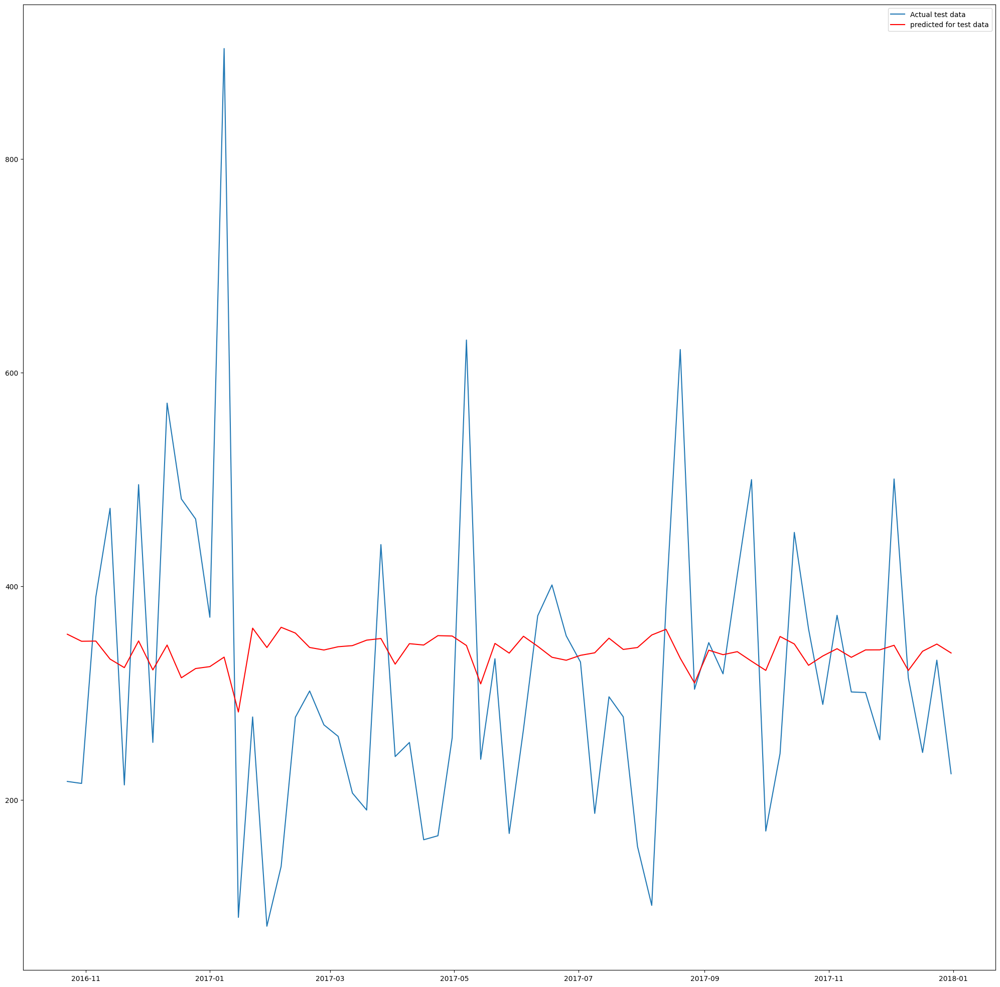

In [103]:
plt.figure(figsize=(25,25))
plt.plot(test['Sales'],label='Actual test data')
plt.plot(pred_arma,'r',label='predicted for test data')
plt.legend(loc='best')
plt.show()

Forecasting for Next 1 Year

In [104]:
Model_04 = ARIMA(train,order = (1,0,0)).fit()

In [105]:
ARMAForcast = Model_04.predict(len(data_04),len(data_04)+52,type ="levels")

In [106]:
P_Value01 = sm.stats.acorr_ljungbox(Model_04.resid,lags=[1],return_df=True)['lb_pvalue'].values

In [107]:
P_Value01

array([0.77549417])

In [108]:
if P_Value01 >0.05:
    print("Tt is Okay")
else:
    print("Tt is Not Okay")

Tt is Okay


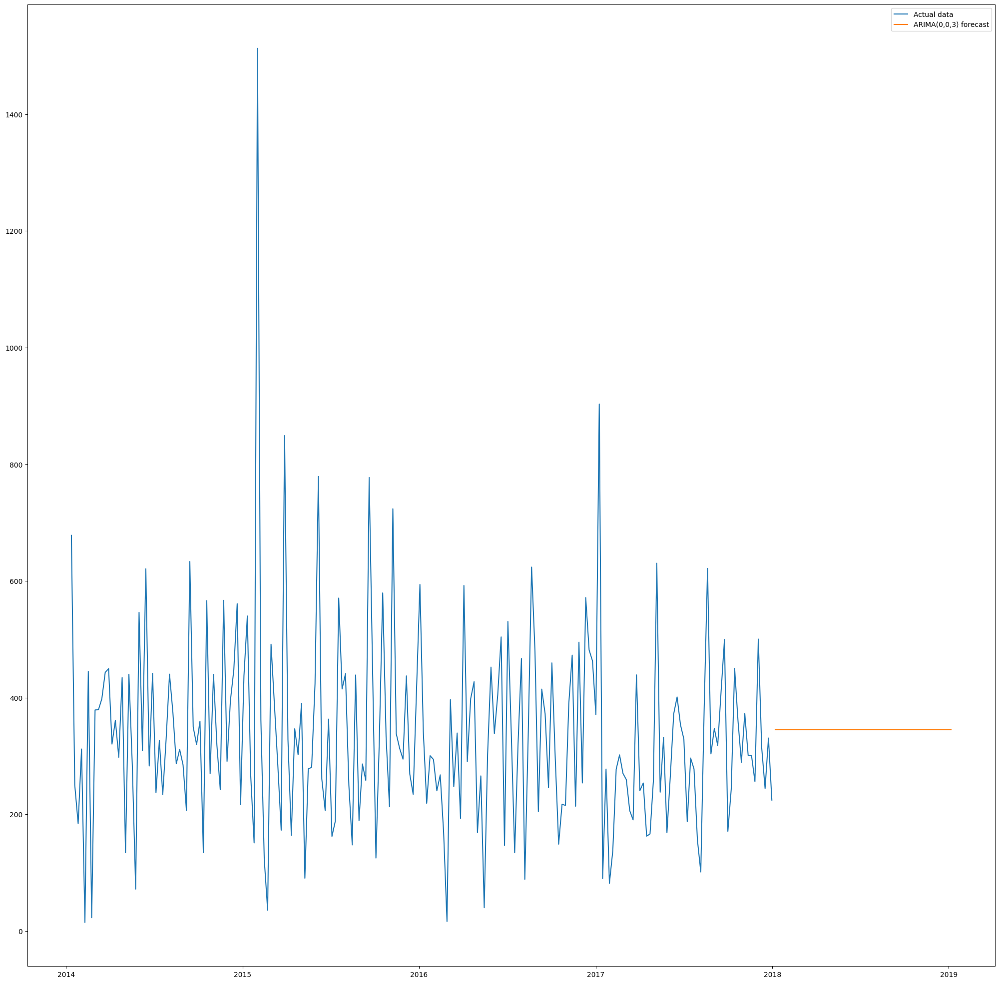

In [109]:
plt.figure(figsize=(25,25))
plt.plot(data_04["Sales"],label='Actual data')
plt.plot(ARMAForcast,label='ARIMA(0,0,3) forecast')
plt.legend(loc='best')
plt.show()

In [110]:
AIC_ARMA = Model_04.aic
BIC_ARMA = Model_04.bic
AIC_ARMA,BIC_ARMA

(1927.436320356152, 1936.3665215834137)

Evaluation

In [111]:
ARMA_Mse = mean_squared_error(test.Sales,pred_arma)
ARMA_Rsme = mean_squared_error(test.Sales,pred_arma,squared=False)

In [112]:
print(ARMA_Mse)
print(ARMA_Rsme)

21126.04618381892
145.34801747467668


## 2 -SARIMA Model

In [113]:
Model_05 = SARIMAX(train,order=(1,0,0),seasonal_order=(1,0,0,7)).fit()

In [114]:
P_Value02 = sm.stats.acorr_ljungbox(Model_05.resid,lags=[1],return_df=True)['lb_pvalue'].values

In [115]:
P_Value02

array([0.26051124])

In [116]:
if P_Value02 >0.05:
    print("Tt is Okay")
else:
    print("Tt is Not Okay")

Tt is Okay


In [117]:
Model_05.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                     
=========================================================================================
Dep. Variable:                             Sales   No. Observations:                  145
Model:             SARIMAX(1, 0, 0)x(1, 0, 0, 7)   Log Likelihood               -1000.187
Date:                           Thu, 30 Mar 2023   AIC                           2006.373
Time:                                   07:55:00   BIC                           2015.303
Sample:                               01-12-2014   HQIC                          2010.002
                                    - 10-16-2016                                         
Covariance Type:                             opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0567      0.084     -0.676      0.499      -0.221       0.108
ar.S.L7        0.8113      0.029     27.585      0.000       0.754       0.869
sigma2       5.45e+04   3804.729     14.324      0.000     4.7e+04     6.2e+04
===================================================================================
Ljung-Box (L1) (Q):                   2.03   Jarque-Bera (JB):               264.94
Prob(Q):                              0.15   Prob(JB):                         0.00
Heteroskedasticity (H):               1.09   Skew:                            -0.12
Prob(H) (two-sided):                  0.77   Kurtosis:                         9.62
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [118]:
AIC_SARIMA=Model_05.aic
BIC_SARIMA=Model_05.bic

In [119]:
AIC_SARIMA

2006.3731819315294

In [120]:
BIC_SARIMA

2015.3033831587911

In [121]:
Sarima_Pred = Model_05.predict(test.index[0],test.index[-1])

In [122]:
Sarima_Pred

2016-10-23    179.521189
2016-10-30    335.478819
2016-11-06    302.011276
2016-11-13    199.268246
2016-11-20    372.706060
                 ...    
2017-12-03     56.660777
2017-12-10     37.385007
2017-12-17     69.923929
2017-12-24     44.852798
2017-12-31     22.649754
Freq: W-SUN, Name: predicted_mean, Length: 63, dtype: float64

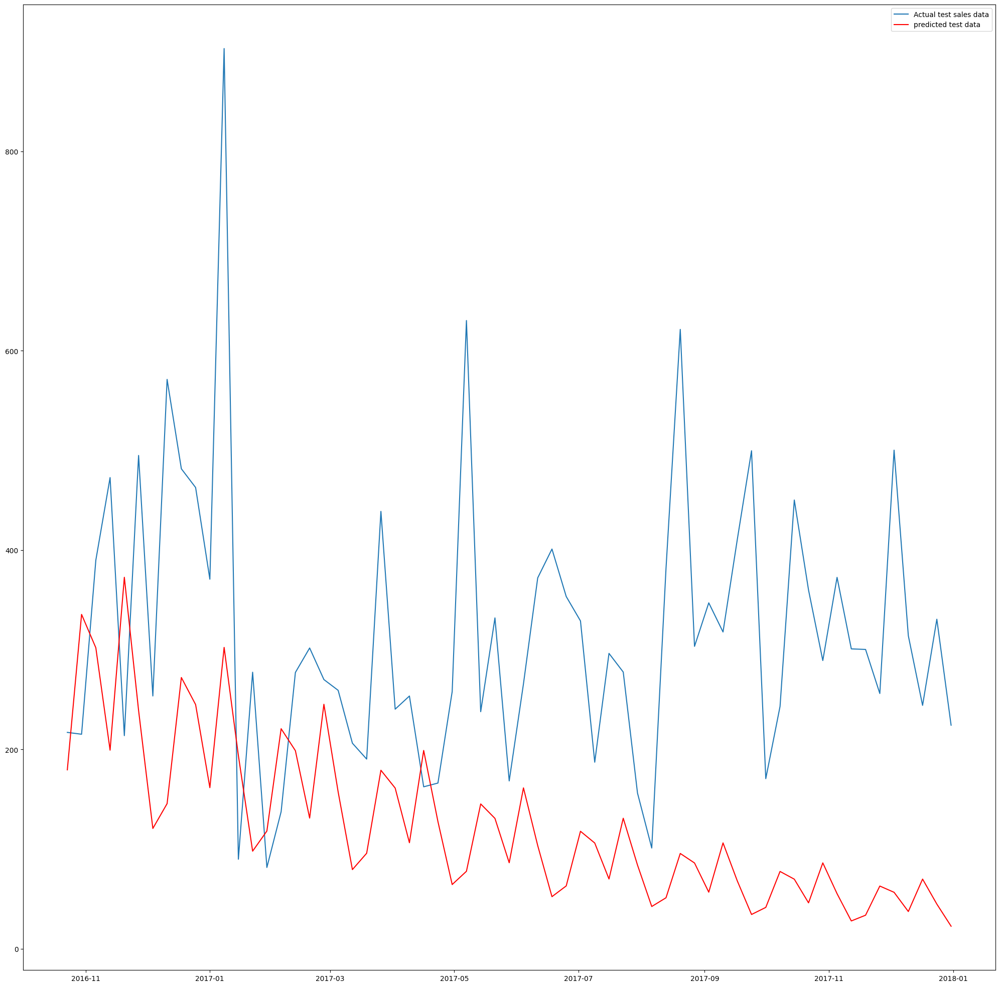

In [123]:
plt.figure(figsize=(25,25))
plt.plot(test.Sales,label='Actual test sales data')
plt.plot(Sarima_Pred,'r',label='predicted test data')
plt.legend(loc='best')
plt.show()

Evaluation

In [124]:
Sarima_Mse = mean_squared_error(test.Sales,Sarima_Pred)
Sarima_Rsme = mean_squared_error(test.Sales,Sarima_Pred,squared=False)

In [125]:
Sarima_Mse,Sarima_Rsme

(61245.1824423452, 247.47764028765346)

In [126]:
Sarima_Forcast = Model_05.predict(len(data_04),len(data_04)+52,type='levels')

In [127]:
Sarima_Forcast

2018-01-07    27.323259
2018-01-14    51.060127
2018-01-21    45.966342
2018-01-28    30.328776
2018-02-04    56.726141
2018-02-11    36.387060
2018-02-18    18.374728
2018-02-25    22.166132
2018-03-04    41.422787
2018-03-11    37.290428
2018-03-18    24.604373
2018-03-25    46.019369
2018-04-01    29.519186
2018-04-08    14.906591
2018-04-15    17.982387
2018-04-22    33.604446
2018-04-29    30.252049
2018-05-06    19.960422
2018-05-13    37.333447
2018-05-20    23.947589
2018-05-27    12.093048
2018-06-03    14.588303
2018-06-10    27.261777
2018-06-17    24.542128
2018-06-24    16.192994
2018-07-01    30.286948
2018-07-08    19.427603
2018-07-15     9.810546
2018-07-22    11.834834
2018-07-29    22.116254
2018-08-05    19.909925
2018-08-12    13.136648
2018-08-19    24.570440
2018-08-26    15.760741
2018-09-02     7.958855
2018-09-09     9.601069
2018-09-16    17.941923
2018-09-23    16.152028
2018-09-30    10.657172
2018-10-07    19.932894
2018-10-14    12.785981
2018-10-21     6

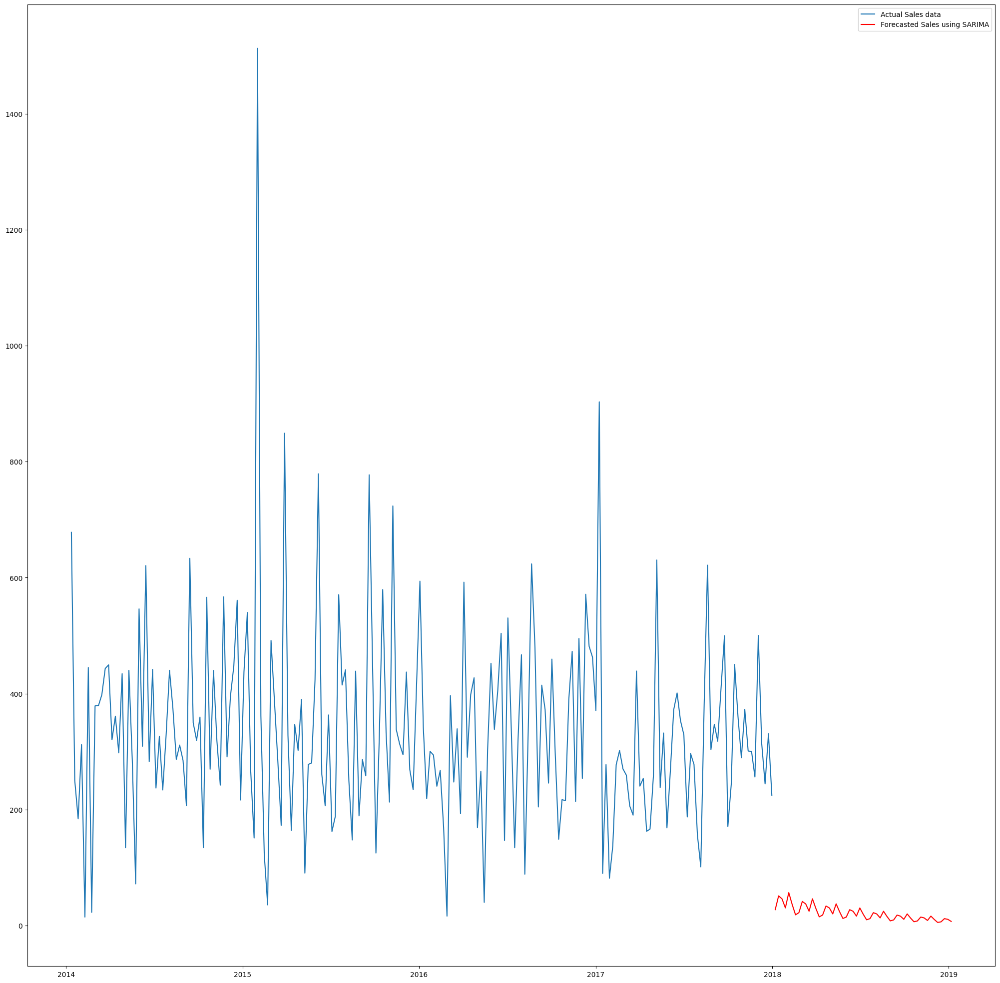

In [128]:
plt.figure(figsize=(25,25))
plt.plot(data_04.Sales,label = 'Actual Sales data')
plt.plot(Sarima_Forcast,'r',label='Forecasted Sales using SARIMA')
plt.legend(loc='best')
plt.show()

#SARIMAX

In [129]:
data_08 = data_01[['Order Date','Sales','Quantity','Profit','Discount']]

Setting Order Date As Index

In [130]:
data_08['Order Date'] = pd.to_datetime(data_08['Order Date'])

<ipython-input-130-5ab505dbf5ad>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_08['Order Date'] = pd.to_datetime(data_08['Order Date'])


In [131]:
data_08 = data_08.set_index('Order Date')

In [132]:
data_08 = data_08.resample('W').mean()

In [133]:
data_08.sample(10)

,Sales,Quantity,Profit,Discount
Order Date,,,,
2015-02-01,1512.850000,6.000000,-363.704640,0.180000
2016-08-07,88.525333,4.333333,21.535467,0.133333
2017-10-01,170.684000,2.928571,-4.313336,0.142857
2017-06-18,401.061679,3.928571,30.408179,0.196429
2014-07-06,237.072000,2.333333,23.069067,0.200000
2016-02-07,240.251750,3.500000,25.948725,0.150000
2014-08-24,311.196000,6.000000,57.534100,0.083333
2014-06-08,309.183500,3.700000,-39.397970,0.210000
2015-08-30,189.126000,2.555556,-21.203633,0.283333


In [134]:
data_08.shape

(208, 4)

In [135]:
data_08.dtypes

Sales       float64
Quantity    float64
Profit      float64
Discount    float64
dtype: object

In [136]:
data_08.isnull().sum()

Sales       0
Quantity    0
Profit      0
Discount    0
dtype: int64

Spliting Data

In [137]:
num1 = int(0.7*len(data_08))
train_01 = data_08.iloc[:num1]
test_01 = data_08.iloc[num1:]

In [138]:
exog_train = train_01[['Quantity','Profit','Discount']]
exog_test = test_01[['Quantity','Profit','Discount']]

In [139]:
Model_06 = SARIMAX(train_01.Sales,order=(1,0,0),seasonal_order=(1,0,0,7),exog=exog_train).fit()

In [140]:
Model_06.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                     
=========================================================================================
Dep. Variable:                             Sales   No. Observations:                  145
Model:             SARIMAX(1, 0, 0)x(1, 0, 0, 7)   Log Likelihood                -946.954
Date:                           Thu, 30 Mar 2023   AIC                           1905.908
Time:                                   07:55:02   BIC                           1923.769
Sample:                               01-12-2014   HQIC                          1913.166
                                    - 10-16-2016                                         
Covariance Type:                             opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Quantity      94.0363      6.843     13.742      0.000      80.624     107.449
Profit        -0.3630      0.112     -3.236      0.001      -0.583      -0.143
Discount    -117.0601    159.757     -0.733      0.464    -430.177     196.057
ar.L1         -0.0869      0.104     -0.833      0.405      -0.291       0.118
ar.S.L7        0.1543      0.096      1.603      0.109      -0.034       0.343
sigma2      2.725e+04   2796.036      9.745      0.000    2.18e+04    3.27e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                89.03
Prob(Q):                              0.94   Prob(JB):                         0.00
Heteroskedasticity (H):               0.87   Skew:                             0.90
Prob(H) (two-sided):                  0.63   Kurtosis:                         6.39
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [141]:
P_Value03 = sm.stats.acorr_ljungbox(Model_06.resid,lags=[1],return_df=True)['lb_pvalue'].values

In [142]:
P_Value03

array([0.92959428])

In [143]:
if P_Value03 >0.05:
    print("Tt is Okay")
else:
    print("Tt is Not Okay")

Tt is Okay


In [144]:
AIC_SARIMAX = Model_06.aic
BIC_SARIMAX = Model_06.bic

**Forcesasted Values for Test Data**

In [145]:
Sarimax_Pred_01 =  Model_06.forecast(len(test_01.Sales),exog = exog_test) 

In [146]:
Sarimax_Pred_01

2016-10-23    299.438472
2016-10-30    412.918152
2016-11-06    389.353769
2016-11-13    322.043197
2016-11-20    279.343735
                 ...    
2017-12-03    426.384747
2017-12-10    365.268442
2017-12-17    267.132381
2017-12-24    301.021079
2017-12-31    288.703329
Freq: W-SUN, Name: predicted_mean, Length: 63, dtype: float64

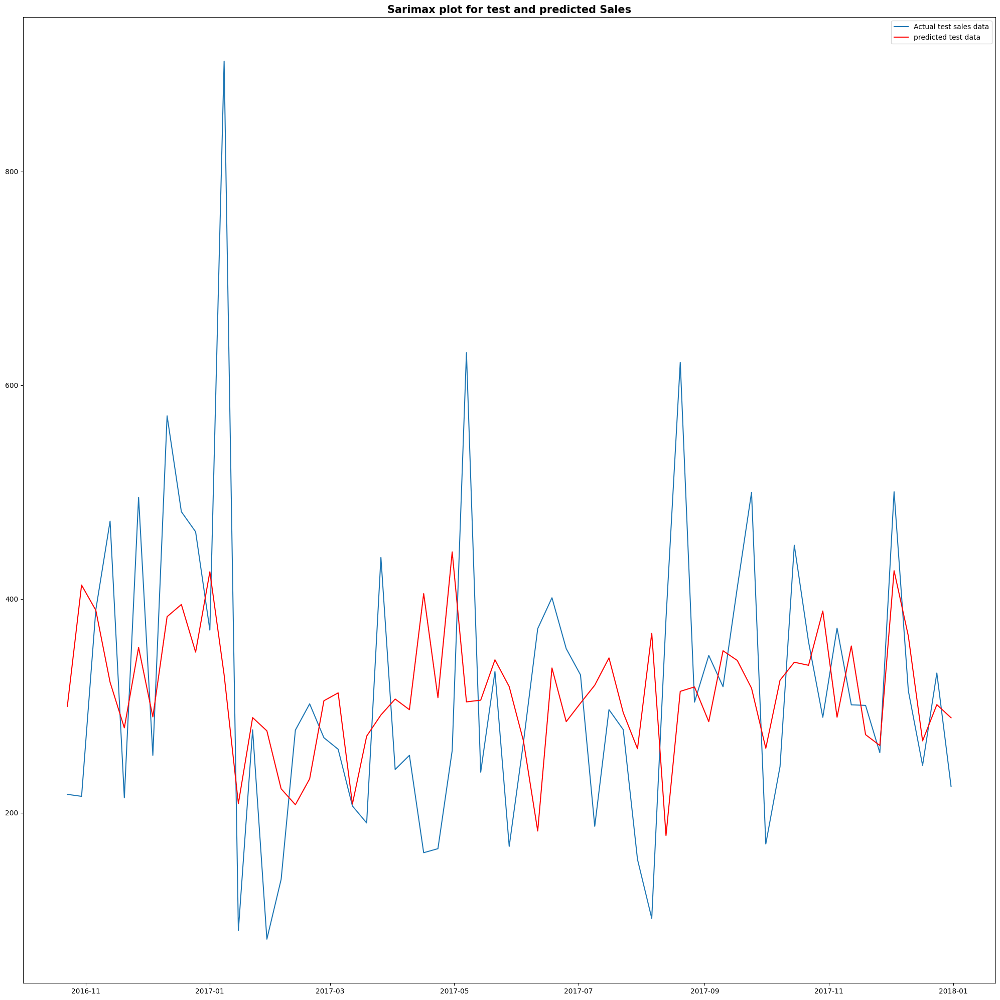

In [147]:
plt.figure(figsize=(25,25))
plt.plot(test_01.Sales,label='Actual test sales data')
plt.plot(Sarimax_Pred_01,'r',label='predicted test data')
plt.legend(loc='best')
plt.title('Sarimax plot for test and predicted Sales',fontweight='bold',size=15)
plt.show()

Evaluation

In [148]:
Sarimax_Mse01 = mean_squared_error(test_01.Sales,Sarimax_Pred_01)
Sarimax_Rmse01= mean_squared_error(test_01.Sales,Sarimax_Pred_01,squared=False)

In [149]:
print(Sarimax_Mse01)
print(Sarimax_Rmse01)

19444.599138414007
139.44389243855036


In [150]:
Sarimax_Pred_02 =  Model_06.predict(len(test_01.Sales)+52,exog = len(exog_test)+52) 

In [151]:
Sarimax_Pred_02

Order Date
2016-03-27    321.529766
2016-04-03    464.606223
2016-04-10    338.815607
2016-04-17    368.209376
2016-04-24    389.367434
2016-05-01    267.564042
2016-05-08    408.820108
2016-05-15    188.868690
2016-05-22    371.321500
2016-05-29    336.475394
2016-06-05    350.011315
2016-06-12    281.358370
2016-06-19    329.922249
2016-06-26    179.927196
2016-07-03    275.912519
2016-07-10    342.088899
2016-07-17    306.861284
2016-07-24    299.994783
2016-07-31    476.446618
2016-08-07    407.710702
2016-08-14    293.632705
2016-08-21    456.000792
2016-08-28    282.189891
2016-09-04    260.742104
2016-09-11    288.956337
2016-09-18    272.554998
2016-09-25    251.021425
2016-10-02    419.380679
2016-10-09    387.480718
2016-10-16    400.144626
Freq: W-SUN, Name: predicted_mean, dtype: float64

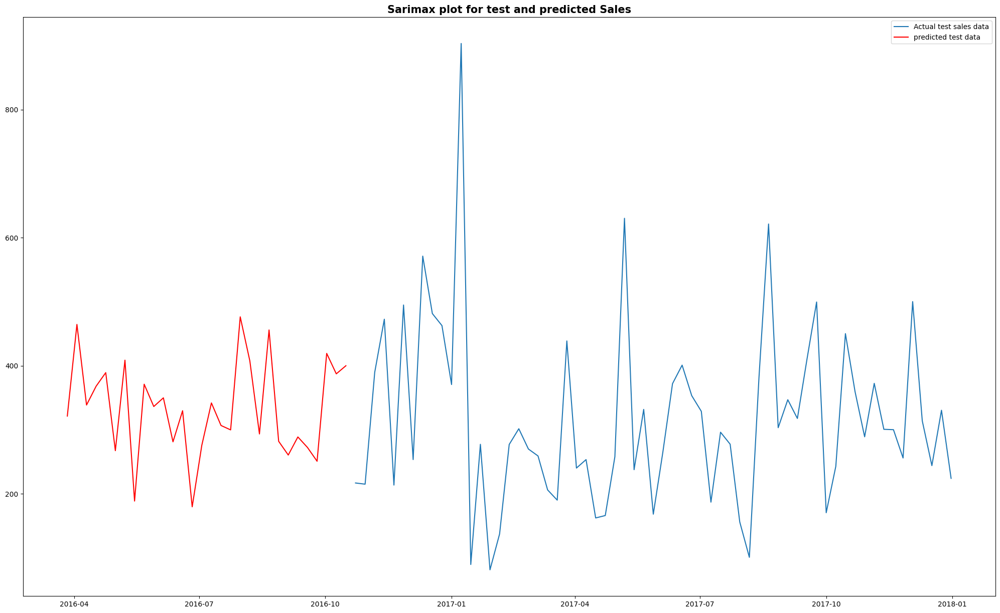

In [152]:
plt.figure(figsize=(25,15))
plt.plot(test_01.Sales,label='Actual test sales data')
plt.plot(Sarimax_Pred_02,'r',label='predicted test data')
plt.legend(loc='best')
plt.title('Sarimax plot for test and predicted Sales',fontweight='bold',size=15)
plt.show()

**Forecast**

In [153]:
Sarimax_forcvalue = Model_06.fittedvalues

In [154]:
Sarimax_forcvalue

Order Date
2014-01-12    270.002645
2014-01-19    398.060507
2014-01-26    270.656314
2014-02-02    223.156112
2014-02-09    177.782430
                 ...    
2016-09-18    272.554998
2016-09-25    251.021425
2016-10-02    419.380679
2016-10-09    387.480718
2016-10-16    400.144626
Freq: W-SUN, Length: 145, dtype: float64

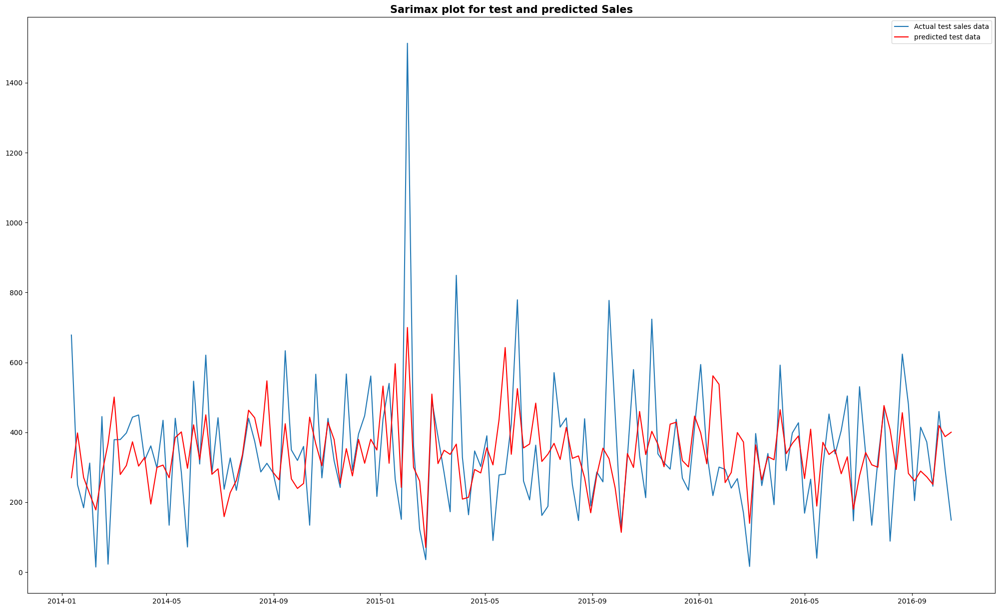

In [155]:
plt.figure(figsize=(25,15))
plt.plot(train_01.Sales,label='Actual test sales data')
plt.plot(Sarimax_forcvalue,'r',label='predicted test data')
plt.legend(loc='best')
plt.title('Sarimax plot for test and predicted Sales',fontweight='bold',size=15)
plt.show()

#Camping All Model

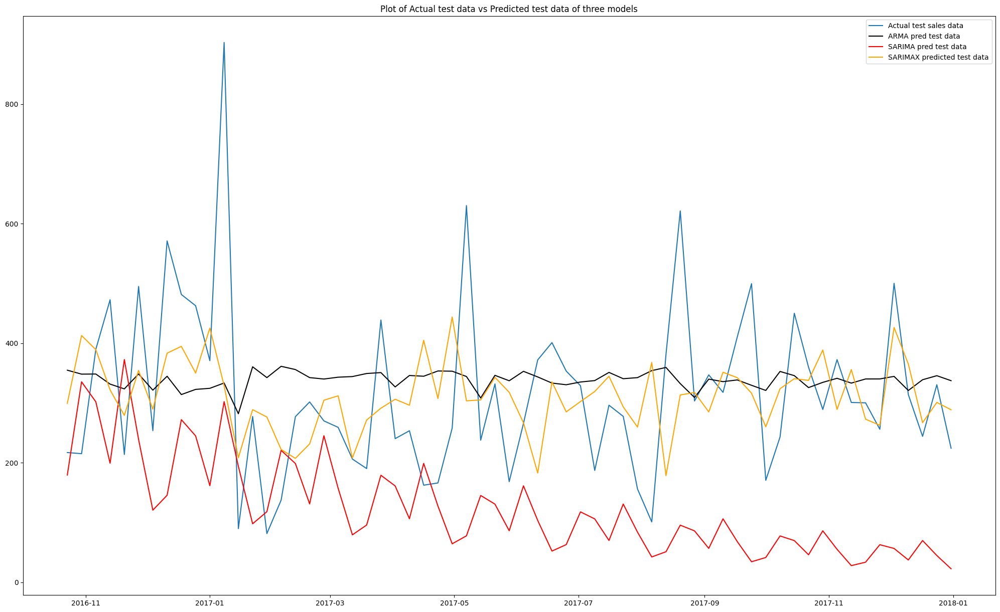

In [156]:
plt.figure(figsize=(25,15))

plt.plot(test_01.Sales,label='Actual test sales data')
plt.plot(pred_arma,'black',label='ARMA pred test data')
plt.plot(Sarima_Pred,'r',label='SARIMA pred test data')
plt.plot(Sarimax_Pred_01,'orange',label='SARIMAX predicted test data')
plt.title('Plot of Actual test data vs Predicted test data of three models')
plt.legend(loc='best')
plt.show()

In [157]:
data_09 = pd.DataFrame({'ARMA':[AIC_ARMA,BIC_ARMA,ARMA_Mse,ARMA_Rsme],'SARIMA':[AIC_SARIMA,BIC_SARIMA,Sarima_Mse,Sarima_Rsme],'SARIMAX':[AIC_SARIMAX,BIC_SARIMAX,Sarimax_Mse01,Sarimax_Rmse01]})
data_09.index = ['AIC','BIC','MSE','RMSE']

In [158]:
data_09

,ARMA,SARIMA,SARIMAX
AIC,1927.436320,2006.373182,1905.908331
BIC,1936.366522,2015.303383,1923.768733
MSE,21126.046184,61245.182442,19444.599138
RMSE,145.348017,247.477640,139.443892


* **Interpretations:-**
   * The best model for predictions is 'SARIMAX' with less AIC,BIC and RMSE values.
   * By Sarimax model the  Predicted values are also nearer to the actual test values.

In [159]:
print("The End")

The End
